In [1]:
import os
import sys
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Bidirectional, Dense, Conv1D, Flatten, MaxPooling1D, RepeatVector, \
    TimeDistributed, LayerNormalization, Dropout, MultiHeadAttention, Input
from tensorflow.keras.optimizers import Adam
import statsmodels.api as sm
from pmdarima import auto_arima
from scipy import stats
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt

2024-08-12 18:47:29.711970: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-08-12 18:47:29.713980: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-12 18:47:29.755271: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-12 18:47:29.756444: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-08-12 18:47:30.388916: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Co

In [2]:
import tensorflow as tf

In [3]:
tf.random.set_seed(7)

In [4]:
def read_data(df, dim_type, gold_data=None, fed_rate=None, use_percentage=1):
    '''
    读取数据(详细说明)
    '''
    #df = pd.read_csv(path)
    data_len = df.shape[0]
    data = None
    if dim_type!='Multi':
        data = df[dim_type].values.reshape((data_len, 1))
    else:
        # Multi
        df["date"]=pd.to_datetime(df["date"], format='%Y-%m-%d %H:%M:%S').dt.strftime('%Y-%m-%d %H:%M:%S')
        #df['CO'] = df['Close'] - df['Open']
        #diff_data = df['CO'].values.reshape((data_len, 1))
        open_data = df["open"].values.reshape((data_len, 1))
        high_data = df["high"].values.reshape((data_len, 1))
        low_data = df["low"].values.reshape((data_len, 1))
        close_data = df["close"].values.reshape((data_len, 1))
        volume_data = df["volume"].values.reshape((data_len, 1))
        if gold_data is not None:
            gold_data['Date']=gold_data['Date'].dt.strftime('%Y-%m-%d')
            df['Gold']=df['Date']
            
            # calc the gold series
            df['Gold'] = df['Gold'].apply(lambda x: gold_data['Close'][x==gold_data['Date']].values[0] if x in gold_data['Date'].values else np.nan)  
            # fillna using interpolating
            df['Gold'] = df['Gold'].interpolate(limit_direction="both")

            gold_data_fill=df["Gold"].values.reshape((data_len, 1))
            if fed_rate is not None:
                fed_rate['DATE']=fed_rate['DATE'].dt.strftime('%Y-%m-%d')
                df['fed']=df['Date']
                
                # calc the gold series
                df['fed'] = df['fed'].apply(lambda x: fed_rate['FEDFUNDS'][x==fed_rate['DATE']].values[0] if x in fed_rate['DATE'].values else np.nan)  
                # fillna using interpolating
                df['fed'] = df['fed'].interpolate(limit_direction="both")
    
                fed_data=df["fed"].values.reshape((data_len, 1))
                data = np.hstack((close_data, open_data, high_data, low_data, volume_data, gold_data_fill, fed_data))
            else:
                data = np.hstack((close_data, open_data, high_data, low_data, volume_data, gold_data_fill))
        else:
            data = np.hstack((close_data, open_data, high_data, low_data, volume_data))
    return data[0:int(np.floor(data_len * use_percentage))], np.floor(data_len * use_percentage)


In [5]:
def split_sequence(sequence, dim_type, n_steps_in, n_steps_out):
    X, y = list(), list()
    for i in range(len(sequence)):
        # find the end of the input pattern
        end_ix = i + n_steps_in
        # find the end of the output pattern
        out_end_ix = end_ix + n_steps_out
        # check if we are beyond the dataset
        if out_end_ix > len(sequence):
            break
        if dim_type == 'Multi':
            # gather input and output parts of the pattern
            seq_x = sequence[i:end_ix, 1:]
            seq_y = sequence[end_ix:out_end_ix, 0]
        else:
            seq_x, seq_y = sequence[i:end_ix], sequence[end_ix:out_end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

def data_trasform(data, anti=False, scaler=None):
    '''
    说明以及例子
    MinMax data and anti MinMax data
    :param data: the data source
    :param model: MinMax and anti MinMax
    :param scaler: anti MinMax scaler
    :return: the transformed data

    '''
    if not anti:
        # 归一化
        # 创建一个空字典来存储每一列的 scaler
        scalers = {}
        # 归一化数据的容器
        normalized_data = np.zeros_like(data)
        # 循环每一列
        for i in range(data.shape[1]):  # data.shape[1] 是列的数量
            # 为每一列创建一个新的 MinMaxScaler
            scaler = MinMaxScaler()
            # 将列数据调整为正确的形状，即(-1, 1)
            column_data = data[:, i].reshape(-1, 1)
            # 拟合并转换数据
            normalized_column = scaler.fit_transform(column_data)
            # 将归一化的数据存回容器中
            normalized_data[:, i] = normalized_column.ravel()
            # 存储scaler以便后续使用
            scalers[i] = scaler
        # 现在 normalized_data 是完全归一化的数据
        # scalers 字典包含每一列的 MinMaxScaler 实例
        return normalized_data, scalers
    else:
        # 反归一化
        # 如果data是三维数组，去除最后一个维度
        if data.ndim == 3 and data.shape[2] == 1:
            data = data.squeeze(axis=2)

        restored_data = np.zeros_like(data)
        for i in range(data.shape[1]):  # 遍历所有列
            column_data = data[:, i].reshape(-1, 1)
            restored_data[:, i] = scaler.inverse_transform(column_data).ravel()
        return restored_data

def create_transformer_model(input_seq_length, output_seq_length, num_features, d_model, num_heads, ff_dim,
                             num_transformer_blocks, dropout_rate=0.1):
    inputs = Input(shape=(input_seq_length, num_features))

    x = Dense(d_model)(inputs)

    for _ in range(num_transformer_blocks):
        attn_output = MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
        attn_output = Dropout(dropout_rate)(attn_output)  # Dropout after attention
        x = LayerNormalization(epsilon=1e-6)(x + attn_output)

        ff_output = Dense(ff_dim, activation="relu")(x)
        ff_output = Dropout(dropout_rate)(ff_output)  # Dropout after first dense layer
        ff_output = Dense(d_model)(ff_output)

        x = LayerNormalization(epsilon=1e-6)(x + ff_output)

    outputs = Dense(output_seq_length)(x[:, -1, :])  # We take the last step's output for forecasting
    model = Model(inputs, outputs)
    return model

def create_model(model_type, n_features, n_steps_in, n_steps_out):
    '''
        create model
        :param model_type:  LSTM,BD LSTM(bidirectional LSTM),ED LSTM(Encoder-Decoder LSTM),CNN
        :param n_features:
        :param n_steps_in:
        :param n_steps_out:
        :return: the created model
    '''
    model = Sequential()
    adam_optimizer = Adam(learning_rate=0.001)
    if model_type == 'LSTM':
        # LSTM
        model.add(LSTM(100, activation='sigmoid', return_sequences=True, input_shape=(n_steps_in, n_features)))
        model.add(LSTM(100, activation='sigmoid'))
        model.add(Dense(n_steps_out))

    elif model_type == 'BD LSTM':
        # bidirectional LSTM
        model.add(Bidirectional(LSTM(50, activation='sigmoid'), input_shape=(n_steps_in, n_features)))
        model.add(Dense(n_steps_out))

    elif model_type == 'ED LSTM':
        # Encoder-Decoder LSTM
        # Encoder
        model.add(LSTM(100, activation='sigmoid', input_shape=(n_steps_in, n_features)))
        # Connector
        model.add(RepeatVector(n_steps_out))
        # Decoder
        model.add(LSTM(100, activation='sigmoid', return_sequences=True))
        model.add(TimeDistributed(Dense(1)))

    elif model_type == 'CNN':
        # CNN
        model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps_in, n_features)))
        model.add(MaxPooling1D(pool_size=2))
        model.add(Flatten())
        model.add(Dense(20, activation='relu'))
        model.add(Dense(n_steps_out))

    elif model_type == 'Convolutional LSTM':
        # Convolutional LSTM
        model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps_in, n_features)))
        model.add(LSTM(20, activation='relu', return_sequences=False))
        model.add(Dense(20, activation='relu'))
        model.add(Dense(n_steps_out))

    elif model_type == 'Transformer':
        model = create_transformer_model(n_steps_in, n_steps_out, n_features, d_model=64,
                                         num_heads=12, ff_dim=64, num_transformer_blocks=3)

    elif model_type == 'MLP':
        # 多层感知机 (MLP)
        model.add(Dense(20, activation='relu', input_shape=(n_steps_in, n_features)))
        model.add(Flatten())
        model.add(Dense(20, activation='relu'))
        model.add(Dense(n_steps_out))

    elif model_type == 'ARIMA':
        if n_features != 1:
            print("ARIMA model only supports univariate time series data")
            print("ARIMA model has no parameter n_steps_in")
            return None
        model = 'ARIMA'
        return model
    
    else:
        print("no model")
    model.compile(optimizer=adam_optimizer, loss='mse')
    return model


def train_and_forecast(model, n_features, dim_type, data_X, data_Y, n_steps_in, n_steps_out, ech):
    # 训练模型
    # 隐藏输出
    sys.stdout = open(os.devnull, 'w')
    sys.stderr = open(os.devnull, 'w')

    X, y = split_sequence(data_X, dim_type, n_steps_in, n_steps_out)
    # 对于多维数据，调整最后一个维度为特征数
    X = X.reshape((X.shape[0], X.shape[1], n_features))

#######################################################################################
    if model == 'ARIMA':
        # 检查数据是否平稳
        fig = plt.figure(figsize=(12, 8))
        ax1 = fig.add_subplot(211)
        fig = sm.graphics.tsa.plot_acf(data_X.squeeze(), lags=40, ax=ax1)
        ax2 = fig.add_subplot(212)
        fig = sm.graphics.tsa.plot_pacf(data_X, lags=40, ax=ax2)
        
        # # 自动确定 ARIMA 模型的参数
        # auto_model = auto_arima(data_X, seasonal=False, trace=True, error_action='ignore', suppress_warnings=True)
        # # 输出最佳 ARIMA 模型的参数
        # print(auto_model.summary())
        
        # 使用最佳参数拟合 ARIMA 模型
        # ARIMA 模型只接受单变量时间序列，这里假设 data_X 和 data_Y 是一维数组
        # order = auto_model.order
        order = (6,1,6)
        arma_model = ARIMA(data_X, order=order)
        model_fit = arma_model.fit()
        # 拟合结果
        fit_result = model_fit.fittedvalues
        # 使用模型进行滚动预测
        history = list(data_X)
        test_result = []
        for t in range(len(data_Y)):
            model = ARIMA(history, order=order)
            model_fit = model.fit()
            output = model_fit.forecast(n_steps_out)
            test_result.append(output)
            history.append(data_Y[t])  # 更新历史数据
        test_result = np.array(test_result)
        fit_result = fit_result.reshape(len(fit_result), 1)
        return fit_result, test_result
#######################################################################################

    # 训练模型
    model.fit(X, y, epochs=ech, batch_size=32, verbose=1)

    # 拟合结果
    fit_result = []
    for index, ele in enumerate(X):
        print(f'Fitting {index}th data')
        pred = model.predict(ele.reshape((1, n_steps_in, n_features)))
        fit_result.append(pred)
    fr = np.array(fit_result)
    fit_result = fr.reshape(len(fit_result), n_steps_out)
    # 测试结果
    test_x, test_y = split_sequence(data_Y, dim_type, n_steps_in, n_steps_out)
    test_x = test_x.reshape((test_x.shape[0], test_x.shape[1], n_features))
    test_result = []
    for index, ele in enumerate(test_x):
        print(f'Predicting {index}th data')
        pred = model.predict(ele.reshape((1, n_steps_in, n_features)))
        test_result.append(pred)
    tr = np.array(test_result)
    test_result = tr.reshape(len(test_result), n_steps_out)

    # 恢复输出
    sys.stdout = sys.__stdout__
    sys.stderr = sys.__stderr__
    return fit_result, test_result

def eval_result(result, n_steps_out, target, mode):
    '''
    evaluate the modl resule
    :param result:the model result
    :param n_steps_out:the days you predict
    :param target:the ground-true
    :param mode:the type of evaluation(you can choose 0：rmse,1：mape)
    :return:the evaluation result
    '''
    if mode==0:
        # return rmse result
        # 归一化
        result, _ = data_trasform(result)
        target, _ = data_trasform(target)
        # 下面需要修改
        rmse = []
        for i in range(n_steps_out):
            rmse.append(np.sqrt(np.mean((result[:, i] - target[:, i]) ** 2)))
        return rmse

    elif mode==1:
        # return MAPE result
        result = result + 0.0000001
        target = target + 0.0000001
        mape = []
        for i in range(n_steps_out):
            mape.append(np.mean(np.abs((target[:, i] - result[:, i]) / target[:, i])) * 100)
        return mape
    else:
        return None

In [6]:
dir_root = '/run/user/1001/gvfs/smb-share:server=10.139.25.246,share=quantdata/Lucas'
file_name = 'ETH.csv'
df = pd.read_csv(os.path.join(dir_root, file_name))
df_eth = df[['date', 'symbol', 'open', 'high', 'low', 'close', 'volume']]

In [7]:
df_eth

,date,symbol,open,high,low,close,volume
0,2017-08-17 04:00:00,ETH,301.13,302.57,298.00,301.61,125.66877
1,2017-08-17 05:00:00,ETH,301.61,303.28,300.00,303.10,377.67246
2,2017-08-17 06:00:00,ETH,302.40,304.44,301.90,302.68,303.86672
3,2017-08-17 07:00:00,ETH,302.68,307.96,302.60,307.96,754.74510
4,2017-08-17 08:00:00,ETH,307.95,309.97,307.00,308.62,150.75029
...,...,...,...,...,...,...,...
60662,2024-07-24 02:00:00,ETH,3443.61,3451.52,3427.40,3449.81,11334.10820
60663,2024-07-24 03:00:00,ETH,3449.81,3459.96,3440.42,3448.36,8846.38840
60664,2024-07-24 04:00:00,ETH,3448.36,3449.58,3432.40,3440.01,7679.60660
60665,2024-07-24 05:00:00,ETH,3440.01,3444.70,3429.61,3441.68,4955.36960


In [8]:
gold_data = None 
fed_rate = None 
dim_type = 'Multi'
use_percentage = 1

n_steps_in = 48  # take prior number of values as input 
n_steps_out = 12 # predict t+number value 

percentage = 0.7  # 训练集百分比
epochs = 25  # 迭代次数
#rounds = 3  # Number of exp

In [9]:
data, data_len = read_data(df_eth, dim_type, gold_data, fed_rate, use_percentage)
data, scalers = data_trasform(data)

# split into train and test
train_set = data[0:int(np.floor(data_len * percentage))]  # 训练集
test_set = data[int(np.floor(data_len * percentage)):]  # 测试集

/tmp/ipykernel_3764797/2459755795.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["date"]=pd.to_datetime(df["date"], format='%Y-%m-%d %H:%M:%S').dt.strftime('%Y-%m-%d %H:%M:%S')


In [10]:
train_set

array([[0.04605691, 0.04595595, 0.04589712, 0.04550448, 0.00025479],
       [0.04636964, 0.04605669, 0.0460455 , 0.04592541, 0.00076572],
       [0.04628149, 0.04622249, 0.04628792, 0.04632529, 0.00061608],
       ...,
       [0.23836089, 0.23941504, 0.23844265, 0.23747317, 0.04668988],
       [0.24009453, 0.23835098, 0.2395628 , 0.23895694, 0.03318976],
       [0.24452098, 0.24008454, 0.24362546, 0.24037336, 0.09195785]])

In [11]:
test_eth_data = df_eth[int(np.floor(data_len * percentage)):]

In [12]:
n_features = len(train_set[0]) - 1 if len(train_set[0]) > 1 else 1 # features of the input 

In [13]:
model_type =['LSTM', 'BD LSTM', 'CNN', 'MLP', 'ED LSTM', 'Convolutional LSTM']

In [14]:
model_use = model_type[5]
Model = create_model(model_use, n_features, n_steps_in, n_steps_out)

train_result, test_result = train_and_forecast(Model, n_features, dim_type, train_set, test_set, n_steps_in,
                                                n_steps_out, epochs)

# ----------------------evaluation--------------------
train_result = data_trasform(train_result, True, scalers[0])  # 反归一化
test_result = data_trasform(test_result, True, scalers[0])  # 反归一化

test_result_list = test_result.tolist()
t_list = list()
for j in range(len(test_result_list)):
    number = test_result_list[j][0]
    t_list.append(number)
#update_dataset_model[pred_name[i]] = t_list

2024-08-12 18:50:51.386324: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1960] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


-0.0715689389156878
-0.025474419665320967
-0.03409318179808015
-0.017219415038932855
-0.0005781153196994638
0.08686599971668929
0.002248816660152261
0.0055226429273616305
0.027105366515513925
0.057289641599835524
0.03518545856923738
0.01816871735689565
0.009560640428481202
-0.040644716769693695
-0.03525994413472527
0.018973773456962228
0.08274001179481275
0.06885961738425085
0.04350227307303103
-0.012779151314643241
0.01729808147598669
0.07238268007204479
0.03379653116515528
0.021263523849575906
0.052136141453235904
0.01869943699789528
-0.04537120100872144
-0.03940935200009171
-0.022185139509430518
0.010362943205652482
0.007258550224402461
-0.03499319292126838
-0.005665840716421371
0.03549313169676389
0.033063986748766545
0.012409270644978097
-0.032210872924880826
-0.013834753390277182
-0.005890859258767523
0.0006376914748108902
0.00820891065051892
-0.021554177735176747
-0.0068907213982725805
-0.02038107633692325
0.03544049427963218
0.032811796750719074
-0.03539269958336481
-0.02199563

/tmp/ipykernel_3764797/916518065.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_eth_new['signal'] = signal
/tmp/ipykernel_3764797/2498058235.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_eth_frama_vwap['diff_frama'] = df_eth_frama_vwap['close'] - df_eth_frama_vwap['FRAMA_48']
/tmp/ipykernel_3764797/3845294441.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docume

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 30.8 MB/s eta 0:00:00m eta 0:00:010:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 27.7 MB/s eta 0:00:00m eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 30.9 MB/s eta 0:00:00m eta 0:00:010:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 308.8/308.8 kB 22.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.9/240.9 kB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.3/129.3 kB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.0/289.0 kB 17.2 MB/s eta 0:00:00
  Attempting uninstall: setuptools
    Found existing installation: setuptools 44.0.0
    Uninstalling setuptools-44.0.0:
      Successfully uninstalled setuptools-44.0.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of t

/home/quant-ws01/py3.8/lib/python3.8/site-packages/ccxt/async_support/binance.py:1519: RuntimeWarning: coroutine 'main' was never awaited
  'legalMoneyCurrenciesById': {


2024-08-13T11:21:07.801Z 1h BTC/USDT 	RSI_14 = 44.048280314104375
2024-08-13T11:21:07.887Z 1h BTC/USDT 	RSI_14 = 44.048280314104375
2024-08-13T11:21:07.970Z 1h BTC/USDT 	RSI_14 = 44.048280314104375
2024-08-13T11:21:08.057Z 1h BTC/USDT 	RSI_14 = 44.048280314104375
2024-08-13T11:21:08.141Z 1h BTC/USDT 	RSI_14 = 44.048280314104375
2024-08-13T11:21:08.231Z 1h BTC/USDT 	RSI_14 = 44.048280314104375
2024-08-13T11:21:08.317Z 1h BTC/USDT 	RSI_14 = 44.04813289712681
2024-08-13T11:21:08.399Z 1h BTC/USDT 	RSI_14 = 44.04813289712681
2024-08-13T11:21:08.482Z 1h BTC/USDT 	RSI_14 = 44.04813289712681
2024-08-13T11:21:08.563Z 1h BTC/USDT 	RSI_14 = 44.04813289712681
2024-08-13T11:21:08.653Z 1h BTC/USDT 	RSI_14 = 44.04813289712681
2024-08-13T11:21:08.741Z 1h BTC/USDT 	RSI_14 = 44.04813289712681
2024-08-13T11:21:08.828Z 1h BTC/USDT 	RSI_14 = 44.04813289712681
2024-08-13T11:21:08.921Z 1h BTC/USDT 	RSI_14 = 44.04813289712681
2024-08-13T11:21:09.013Z 1h BTC/USDT 	RSI_14 = 44.04813289712681
2024-08-13T11:21:09

binance requires to release all resources with an explicit call to the .close() coroutine. If you are using the exchange instance with async coroutines, add `await exchange.close()` to your code into a place when you're done with the exchange and don't need the exchange instance anymore (at the end of your async coroutine).
Unclosed client session
client_session: <aiohttp.client.ClientSession object at 0x7f624150f1c0>


2024-08-13T02:00:00.000Z binance BTC/USDT [59740.0, 59782.71, 59269.85, 59481.99, 891.59566]
2024-08-13T02:00:00.000Z binance BTC/USDT [59740.0, 59782.71, 59269.85, 59481.99, 891.59566]
2024-08-13T02:00:00.000Z binance BTC/USDT [59740.0, 59782.71, 59269.85, 59481.99, 891.59566]
2024-08-13T02:00:00.000Z binance BTC/USDT [59740.0, 59782.71, 59269.85, 59481.99, 891.59566]
2024-08-13T02:00:00.000Z binance BTC/USDT [59740.0, 59782.71, 59269.85, 59481.99, 891.59566]
2024-08-13T02:00:00.000Z binance BTC/USDT [59740.0, 59782.71, 59269.85, 59481.99, 891.59566]
2024-08-13T02:00:00.000Z binance BTC/USDT [59740.0, 59782.71, 59269.85, 59481.99, 891.59566]
2024-08-13T02:00:00.000Z binance BTC/USDT [59740.0, 59782.71, 59269.85, 59481.99, 891.59566]
2024-08-13T02:00:00.000Z binance BTC/USDT [59740.0, 59782.71, 59269.85, 59481.99, 891.59566]
2024-08-13T02:00:00.000Z binance BTC/USDT [59740.0, 59782.71, 59269.85, 59481.99, 891.59566]
2024-08-13T02:00:00.000Z binance BTC/USDT [59740.0, 59782.71, 59269.85

binance requires to release all resources with an explicit call to the .close() coroutine. If you are using the exchange instance with async coroutines, add `await exchange.close()` to your code into a place when you're done with the exchange and don't need the exchange instance anymore (at the end of your async coroutine).
Unclosed client session
client_session: <aiohttp.client.ClientSession object at 0x7f622f26aee0>
/home/quant-ws01/py3.8/lib/python3.8/site-packages/ccxt/base/exchange.py:2736: RuntimeWarning: coroutine 'main' was never awaited
  'withdraw': {


2024-08-13T16:00:00.000Z binance BTC/USDT [59472.25, 61171.86, 59446.22, 61157.59, 3358.11036]
2024-08-13T16:00:00.000Z binance BTC/USDT [59472.25, 61171.86, 59446.22, 61157.59, 3358.11036]
2024-08-13T16:00:00.000Z binance BTC/USDT [59472.25, 61171.86, 59446.22, 61157.59, 3358.11036]
2024-08-13T16:00:00.000Z binance BTC/USDT [59472.25, 61171.86, 59446.22, 61157.59, 3358.11036]
2024-08-13T16:00:00.000Z binance BTC/USDT [59472.25, 61171.86, 59446.22, 61157.59, 3358.11036]
2024-08-13T16:00:00.000Z binance BTC/USDT [59472.25, 61171.86, 59446.22, 61157.59, 3358.11036]
2024-08-13T16:00:00.000Z binance BTC/USDT [59472.25, 61171.86, 59446.22, 61157.59, 3358.11036]
2024-08-13T16:00:00.000Z binance BTC/USDT [59472.25, 61171.86, 59446.22, 61157.59, 3358.11036]
2024-08-13T16:00:00.000Z binance BTC/USDT [59472.25, 61171.86, 59446.22, 61157.59, 3358.11036]
2024-08-13T16:00:00.000Z binance BTC/USDT [59472.25, 61171.86, 59446.22, 61157.59, 3358.11036]
2024-08-13T16:00:00.000Z binance BTC/USDT [59472.2

binance requires to release all resources with an explicit call to the .close() coroutine. If you are using the exchange instance with async coroutines, add `await exchange.close()` to your code into a place when you're done with the exchange and don't need the exchange instance anymore (at the end of your async coroutine).
Unclosed client session
client_session: <aiohttp.client.ClientSession object at 0x7f6241441a90>
/tmp/ipykernel_3764797/856455945.py:8: RuntimeWarning: coroutine 'binance.fetch_ohlcv' was never awaited
  ohlcv = exchange.fetch_ohlcv(symbol, timeframe)


--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'corouti

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
----------------------------------------------

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'corouti

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'corouti

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'corouti

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
--------------------------------------------------------------
TypeError object of type 'coroutine' has no len()
---------------------------------------------

In [15]:
test_result_list

[[1133.9954833984375,
  1146.9754638671875,
  1135.272705078125,
  1143.544921875,
  1142.3121337890625,
  1139.7396240234375,
  1142.6011962890625,
  1147.8917236328125,
  1145.6375732421875,
  1145.2672119140625,
  1140.39990234375,
  1137.346435546875],
 [1135.6834716796875,
  1146.85595703125,
  1136.24462890625,
  1145.7850341796875,
  1143.04833984375,
  1141.2012939453125,
  1144.48388671875,
  1150.2015380859375,
  1147.598388671875,
  1146.8099365234375,
  1142.1376953125,
  1138.3447265625],
 [1132.86376953125,
  1144.8590087890625,
  1133.17919921875,
  1142.6279296875,
  1141.2982177734375,
  1137.6871337890625,
  1141.084716796875,
  1147.2265625,
  1144.33056640625,
  1144.646240234375,
  1139.931396484375,
  1135.306396484375],
 [1119.816650390625,
  1133.126953125,
  1119.798828125,
  1129.1002197265625,
  1129.283935546875,
  1123.780029296875,
  1127.3505859375,
  1133.6385498046875,
  1130.618408203125,
  1131.75830078125,
  1126.9615478515625,
  1121.7867431640625],

In [22]:
t_list_12 = list()
for j in range(len(test_result_list)):
    number = test_result_list[j][11]
    t_list_12.append(number)

In [16]:
len(test_result_list)

18142

In [18]:
update_dataset_model = test_eth_data[n_steps_in:]

In [19]:
update_dataset_model

,date,symbol,open,high,low,close,volume
42514,2022-06-28 21:00:00,ETH,1161.75,1168.41,1161.29,1167.22,19076.5000
42515,2022-06-28 22:00:00,ETH,1167.23,1167.79,1145.52,1148.25,41195.9375
42516,2022-06-28 23:00:00,ETH,1148.26,1151.97,1136.32,1144.05,46065.9949
42517,2022-06-29 00:00:00,ETH,1144.05,1152.20,1133.03,1141.38,57600.3540
42518,2022-06-29 01:00:00,ETH,1141.37,1154.26,1138.57,1151.00,29836.2531
...,...,...,...,...,...,...,...
60662,2024-07-24 02:00:00,ETH,3443.61,3451.52,3427.40,3449.81,11334.1082
60663,2024-07-24 03:00:00,ETH,3449.81,3459.96,3440.42,3448.36,8846.3884
60664,2024-07-24 04:00:00,ETH,3448.36,3449.58,3432.40,3440.01,7679.6066
60665,2024-07-24 05:00:00,ETH,3440.01,3444.70,3429.61,3441.68,4955.3696


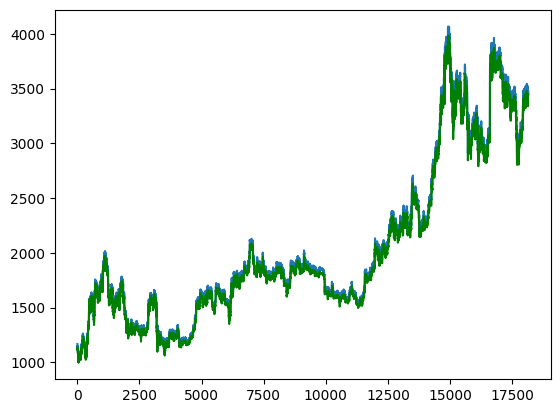

In [24]:
plt.plot(update_dataset_model['close'].tolist())
plt.plot(t_list_12,'green')

In [26]:
signal_eth = []
eth_close = update_dataset_model['close'].tolist()
for i in range(len(t_list_12)):
    diff = t_list_12[i] - eth_close[i]
    if diff > 0:
        signal_eth.append(1)
    elif diff < 0:
        signal_eth.append(-1)
    else:
        signal_eth.append(0)

In [28]:
signal_eth

[-1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 1,
 -1,
 1,
 1,
 -1,
 -1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -

In [27]:
len(signal_eth)

18142

In [34]:
trading_cost = 2.5/10000
pct_return_list_eth = []
init_money = 10000
for i in range(len(signal_eth)):
    if signal_eth[i] > 0:
        pct_return_eth = ((init_money / (eth_close[i] * (1 + trading_cost))) * (eth_close[i+11]*(1 - trading_cost)) - init_money) / init_money
        #print(pct_return_eth)
        pct_return_list_eth.append(pct_return_eth)

In [33]:
pct_return_eth

0.06689870494426686

In [36]:
len(pct_return_list_eth)

258

In [37]:
pct_return_eth_array = np.array(pct_return_list_eth)

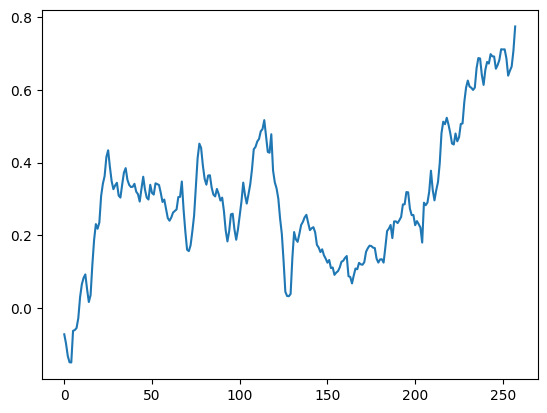

In [38]:
plt.plot(pct_return_eth_array.cumsum())

In [42]:
import pandas_ta as ta

In [45]:
eth_macd = ta.macd(df_eth['close'], length=20)

In [46]:
eth_macd

,MACD_12_26_9,MACDh_12_26_9,MACDs_12_26_9
0,NaN,NaN,NaN
1,NaN,NaN,NaN
2,NaN,NaN,NaN
3,NaN,NaN,NaN
4,NaN,NaN,NaN
...,...,...,...
60662,-5.121483,-0.628888,-4.492595
60663,-5.829686,-1.069672,-4.760013
60664,-6.984206,-1.779354,-5.204852
60665,-7.675934,-1.976866,-5.699068


In [47]:
df_eth_new = df_eth.join(eth_macd)

In [48]:
df_eth_new

,date,symbol,open,high,low,close,volume,MACD_12_26_9,MACDh_12_26_9,MACDs_12_26_9
0,2017-08-17 04:00:00,ETH,301.13,302.57,298.00,301.61,125.66877,NaN,NaN,NaN
1,2017-08-17 05:00:00,ETH,301.61,303.28,300.00,303.10,377.67246,NaN,NaN,NaN
2,2017-08-17 06:00:00,ETH,302.40,304.44,301.90,302.68,303.86672,NaN,NaN,NaN
3,2017-08-17 07:00:00,ETH,302.68,307.96,302.60,307.96,754.74510,NaN,NaN,NaN
4,2017-08-17 08:00:00,ETH,307.95,309.97,307.00,308.62,150.75029,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
60662,2024-07-24 02:00:00,ETH,3443.61,3451.52,3427.40,3449.81,11334.10820,-5.121483,-0.628888,-4.492595
60663,2024-07-24 03:00:00,ETH,3449.81,3459.96,3440.42,3448.36,8846.38840,-5.829686,-1.069672,-4.760013
60664,2024-07-24 04:00:00,ETH,3448.36,3449.58,3432.40,3440.01,7679.60660,-6.984206,-1.779354,-5.204852
60665,2024-07-24 05:00:00,ETH,3440.01,3444.70,3429.61,3441.68,4955.36960,-7.675934,-1.976866,-5.699068


In [51]:
def cal_PO(df, short_period, long_period):
    ema_short = df.ta.ema(length=short_period)
    ema_long = df.ta.ema(length=long_period)
    po_indicator = (ema_short - ema_long) / ema_long * 100
    return pd.Series(po_indicator.tolist(), name='PO_ind')

In [52]:
po_ind = cal_PO(df_eth, short_period=12, long_period=60)

In [55]:
df_eth_new = df_eth_new.join(po_ind)

In [58]:
eth_sma = ta.sma(df_eth['close'], length=60)

In [59]:
df_eth_new = df_eth_new.join(eth_sma)

In [60]:
df_eth_new

,date,symbol,open,high,low,close,volume,MACD_12_26_9,MACDh_12_26_9,MACDs_12_26_9,PO_ind,SMA_60
0,2017-08-17 04:00:00,ETH,301.13,302.57,298.00,301.61,125.66877,NaN,NaN,NaN,NaN,NaN
1,2017-08-17 05:00:00,ETH,301.61,303.28,300.00,303.10,377.67246,NaN,NaN,NaN,NaN,NaN
2,2017-08-17 06:00:00,ETH,302.40,304.44,301.90,302.68,303.86672,NaN,NaN,NaN,NaN,NaN
3,2017-08-17 07:00:00,ETH,302.68,307.96,302.60,307.96,754.74510,NaN,NaN,NaN,NaN,NaN
4,2017-08-17 08:00:00,ETH,307.95,309.97,307.00,308.62,150.75029,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
60662,2024-07-24 02:00:00,ETH,3443.61,3451.52,3427.40,3449.81,11334.10820,-5.121483,-0.628888,-4.492595,-0.363387,3480.903833
60663,2024-07-24 03:00:00,ETH,3449.81,3459.96,3440.42,3448.36,8846.38840,-5.829686,-1.069672,-4.760013,-0.399072,3480.044000
60664,2024-07-24 04:00:00,ETH,3448.36,3449.58,3432.40,3440.01,7679.60660,-6.984206,-1.779354,-5.204852,-0.455435,3478.753833
60665,2024-07-24 05:00:00,ETH,3440.01,3444.70,3429.61,3441.68,4955.36960,-7.675934,-1.976866,-5.699068,-0.493484,3478.305167


In [61]:
df_eth_new = df_eth_new.dropna()

In [62]:
macd_line = df_eth_new['MACD_12_26_9'].tolist()
macd_signal_line = df_eth_new['MACDs_12_26_9'].tolist()
po_ind = df_eth_new['PO_ind'].tolist()
sma_60 = df_eth_new['SMA_60'].tolist()
eth_close = df_eth_new['close'].tolist()

In [64]:
sma_close_diff = []
for i in range(len(sma_60)):
    sma_close_diff.append(eth_close[i] - sma_60[i])

In [67]:
signal = []
for i in range(len(po_ind)):
    if i == 0:
        signal.append(0)
    else:
        if po_ind[i] > 0 and po_ind[i-1] < 0 and macd_line[i] > macd_signal_line[i] and sma_close_diff[i] > 0:
            signal.append(1)
        elif po_ind[i] < 0 and po_ind[i-1] > 0 and macd_line[i] < macd_signal_line[i] and sma_close_diff[i] < 0:
            signal.append(-1)
        else:
            signal.append(0)

In [69]:
df_eth_new['signal'] = signal

In [71]:
df_eth_new

,date,symbol,open,high,low,close,volume,MACD_12_26_9,MACDh_12_26_9,MACDs_12_26_9,PO_ind,SMA_60,signal
59,2017-08-19 15:00:00,ETH,283.88,288.64,283.01,288.64,87.21250,-3.525503,-0.071643,-3.453861,-3.681228,299.657000,0
60,2017-08-19 16:00:00,ETH,288.64,290.16,286.12,286.14,61.94884,-3.462664,-0.007042,-3.455621,-3.666385,299.399167,0
61,2017-08-19 17:00:00,ETH,286.19,293.15,284.16,293.15,11.12991,-2.814767,0.512683,-3.327450,-3.349888,299.233333,0
62,2017-08-19 18:00:00,ETH,294.33,295.00,288.95,295.00,41.13882,-2.127501,0.959960,-3.087460,-2.998393,299.105333,0
63,2017-08-19 19:00:00,ETH,292.64,293.38,291.99,293.31,13.16832,-1.699614,1.110277,-2.809891,-2.764534,298.861167,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
60662,2024-07-24 02:00:00,ETH,3443.61,3451.52,3427.40,3449.81,11334.10820,-5.121483,-0.628888,-4.492595,-0.363387,3480.903833,0
60663,2024-07-24 03:00:00,ETH,3449.81,3459.96,3440.42,3448.36,8846.38840,-5.829686,-1.069672,-4.760013,-0.399072,3480.044000,0
60664,2024-07-24 04:00:00,ETH,3448.36,3449.58,3432.40,3440.01,7679.60660,-6.984206,-1.779354,-5.204852,-0.455435,3478.753833,0
60665,2024-07-24 05:00:00,ETH,3440.01,3444.70,3429.61,3441.68,4955.36960,-7.675934,-1.976866,-5.699068,-0.493484,3478.305167,0


In [73]:
decision_price = []
for i in range(len(signal)):
    if signal[i] == 1:
        decision_price.append(eth_close[i])
    elif signal[i] == -1:
        decision_price.append(-1* eth_close[i])

In [82]:
len(decision_price)

1089

In [94]:
((10000/301 + 10000 / 301) * 294.18 - 20000) / 20000

-0.022657807308970043

In [84]:
decision_price

[298.13,
 -279.96,
 317.74,
 -347.61,
 323.5,
 -299.99,
 301.14,
 301.53,
 -294.18,
 261.96,
 -243.0,
 260.0,
 -278.0,
 282.8,
 -280.0,
 302.01,
 -297.51,
 -298.13,
 295.37,
 -304.1,
 304.49,
 -298.37,
 304.03,
 -300.12,
 315.37,
 -318.06,
 339.48,
 -330.01,
 302.02,
 -294.02,
 295.5,
 -293.92,
 298.78,
 -303.14,
 297.9,
 -294.73,
 301.06,
 -287.8,
 298.48,
 -301.0,
 316.03,
 -299.0,
 315.59,
 -419.76,
 449.99,
 -459.51,
 464.0,
 -455.68,
 439.74,
 -411.24,
 449.5,
 -746.5,
 693.04,
 -670.0,
 733.7,
 -691.1,
 727.45,
 -1183.05,
 1276.99,
 -1275.69,
 1332.0,
 -1295.51,
 1053.02,
 1053.91,
 -1045.87,
 1032.8,
 -1009.55,
 1061.31,
 -1136.37,
 1152.51,
 -1096.0,
 -1116.0,
 810.12,
 -796.58,
 848.45,
 -832.52,
 850.96,
 846.8,
 -899.89,
 945.31,
 -931.18,
 869.4,
 -833.5,
 -826.1,
 853.04,
 -865.23,
 -858.35,
 -859.66,
 867.88,
 -857.0,
 729.3,
 -710.65,
 729.2,
 -697.48,
 550.26,
 553.35,
 -535.99,
 541.99,
 539.14,
 -528.32,
 395.11,
 -385.39,
 382.05,
 -502.32,
 514.28,
 -505.03,
 515.6,

In [102]:
pct_return_list = []
init_money = 10000
trading_cost = 2.5 / 10000
total_eth = 0
count = 0
for i in range(len(decision_price)):
    if decision_price[i] > 0:
        eth_amount = init_money / (decision_price[i] * (1 + trading_cost))
        total_eth = total_eth + eth_amount
        count = count + 1
    elif decision_price[i] < 0 and total_eth > 0:
        pct_return = (total_eth * (-1 * decision_price[i]) * (1-trading_cost) - init_money*count) / init_money*count
        count = 0
        total_eth = 0
        pct_return_list.append(pct_return)

In [ ]:
pct_return_list_short = []
for i in range(len(decision_price)):
    if decision_price[i] < 0 and decision_priec[i] > 0:
        

In [103]:
pct_return_list

[-0.06141597629808002,
 0.09346081211175751,
 -0.07313742661707075,
 -0.09692773963887376,
 -0.07284115755303046,
 0.06869628746659491,
 -0.010395915872517253,
 -0.015392595677443933,
 0.029041500501064,
 -0.02058901019104651,
 -0.013354019321699707,
 0.00802552477268964,
 -0.02838153575780707,
 -0.02697494621775313,
 -0.005844071976929627,
 0.014085507339946707,
 -0.01113571053359501,
 -0.04452223488338368,
 0.007938681370932864,
 -0.054360227302285964,
 0.32941529344049486,
 0.020645575289214867,
 -0.018421946237578594,
 -0.06527850231465891,
 0.6599039895198614,
 -0.033728091121626856,
 -0.05853272949992024,
 0.6254843945897157,
 -0.0015173850841474633,
 -0.0278810759021957,
 -0.030822543786346798,
 -0.023000240935118564,
 0.07018868851772568,
 -0.04950747762209594,
 -0.01720509363105084,
 -0.019265903660804905,
 0.23826956765172216,
 -0.015439880707484371,
 -0.04177207940940916,
 0.013783050181372892,
 -0.013029903790587013,
 -0.026059558742564513,
 -0.04397785633130934,
 -0.116553

In [106]:
len(pct_return_list)

489

In [107]:
pct_return_array = np.array(pct_return_list[300:])

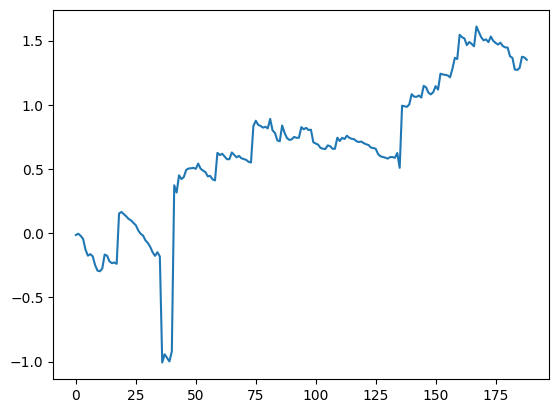

In [108]:
plt.plot(pct_return_array.cumsum())

In [122]:
df_eth_2022 = df_eth[38221:]

In [155]:
df_eth_timeindex = df_eth_2022.copy()

In [156]:
df_eth_timeindex = df_eth_timeindex.set_index(df_eth_timeindex['date'])

In [157]:
df_eth_timeindex.index = pd.to_datetime(df_eth_timeindex.index)

In [158]:
df_eth_vwap = df_eth_timeindex.join(df_eth_timeindex.ta.vwap(anchor='h'))

In [159]:
df_eth_vwap.fillna(method='ffill', inplace=True)

In [162]:
def cal_FRAMA(prices: pd.Series, periods: int, clip=True) -> pd.Series:
    T = int(periods/2)
    df = prices.copy().reset_index().drop(columns=prices.index.name)
    #df = prices.copy().reset_index()
    df = df[df.columns[0]]
    # 1.用窗口 W1 内的最高价和最低价计算 N1 = (最高价 – 最低价) / T
    N1 = (df.rolling(T).max()-df.rolling(T).min())/T
 
    # 2.用窗口 W2 内的最高价和最低价计算 N2 = (最高价 – 最低价) / T
    n2_df = df.shift(T)
    N2 = (n2_df.rolling(T).max()-n2_df.rolling(T).min())/T
 
    # 3.用窗口 T 内的最高价和最低价计算 N3 = (最高价 – 最低价) / (2T)
    N3 = (df.rolling(periods).max() -
          df.rolling(periods).min())/periods
 
    # 4.计算分形维数 D = [log(N1+N2) – log(N3)] / log(2)
    D = (np.log10(N1+N2)-np.log10(N3))/np.log10(2)
 
    # 5.计算指数移动平均的参数 alpha = exp(-4.6(D-1))
    alpha = np.exp(-4.6*(D-1))
 
    # 设置上线
    if clip:
        alpha = np.clip(alpha, 0.01, 0.2)
    #display(alpha)
    FRAMA = []
    #idx = min(np.argwhere(~np.isnan(alpha)))-1
    idx = min(alpha[alpha.notnull()].index.to_numpy())-1
    for row, data in enumerate(alpha):
        if row == (idx):
            FRAMA.append(df.iloc[row])
        elif row > (idx):
            FRAMA.append(data*df.iloc[row] +
                         (1-data)*FRAMA[-1])
        else:
            FRAMA.append(np.nan)

    series_name = 'FRAMA_' + str(periods)
    FRAMA_se = pd.Series(FRAMA, index=prices.index, name=series_name)
 
    return FRAMA_se

# RSI and VWAP indicator

In [273]:
df_eth_rsi = df_eth_vwap.join(ta.rsi(df_eth_vwap['VWAP_H']))

In [274]:
df_eth_rsi = df_eth_rsi.dropna()

In [277]:
rsi_ind = df_eth_rsi['RSI_14'].tolist()

In [278]:
eth_close = df_eth_rsi['close'].tolist()

In [304]:
total_eth = 0
count = 0
pct_return_rsi = []
init_money = 10000
trading_cost = 2.5 / 10000
for i in range(len(rsi_ind)):
    if rsi_ind[i] < 30:
        eth_amount = init_money / (eth_close[i] * (1 + trading_cost))
        total_eth = total_eth + eth_amount
        count = count + 1
    elif rsi_ind[i] >= 70 and total_eth > 0:
        pct_return = (total_eth * (eth_close[i] * (1 - trading_cost)) - init_money*count) / (init_money * count)
        pct_return_rsi.append(pct_return)
        total_eth = 0
        count = 0
        

In [286]:
len(rsi_ind)

22432

In [285]:
len(pct_return_rsi)

119

In [305]:
pct_return_rsi_array = np.array(pct_return_rsi)

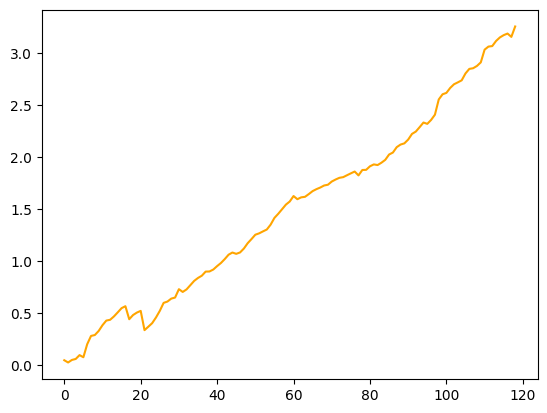

In [306]:
plt.plot(pct_return_rsi_array.cumsum(), 'orange')

In [287]:
dir_root = '/run/user/1001/gvfs/smb-share:server=10.139.25.246,share=quantdata/Lucas'
file_name = 'BTC.csv'
df = pd.read_csv(os.path.join(dir_root, file_name))
df_btc = df[['date', 'symbol', 'open', 'high', 'low', 'close', 'volume']]

In [290]:
df_btc_2022 = df_btc[38221:]

In [439]:
df_btc_2020 = df_btc[29000:50000]

In [467]:
df_btc_timeindex = df_btc_2022.copy()
df_btc_timeindex = df_btc_timeindex.set_index(df_btc_timeindex['date'])
df_btc_timeindex.index = pd.to_datetime(df_btc_timeindex.index)
df_btc_vwap = df_btc_timeindex.join(df_btc_timeindex.ta.vwap(anchor='h'))
df_btc_vwap.fillna(method='ffill', inplace=True)

In [441]:
df_btc_vwap

,date,symbol,open,high,low,close,volume,VWAP_H
date,,,,,,,,
2020-12-12 01:00:00,2020-12-12 01:00:00,BTC,18342.05,18375.00,18271.10,18283.84,1922.630745,18309.980000
2020-12-12 02:00:00,2020-12-12 02:00:00,BTC,18283.84,18350.00,18278.14,18319.99,1370.498539,18316.043333
2020-12-12 03:00:00,2020-12-12 03:00:00,BTC,18319.99,18336.82,18268.34,18282.02,1178.519836,18295.726667
2020-12-12 04:00:00,2020-12-12 04:00:00,BTC,18282.01,18390.00,18261.32,18370.28,1520.776570,18340.533333
2020-12-12 05:00:00,2020-12-12 05:00:00,BTC,18370.28,18398.19,18310.01,18313.36,1600.542043,18340.520000
...,...,...,...,...,...,...,...,...
2023-05-06 15:00:00,2023-05-06 15:00:00,BTC,28606.62,28633.01,28300.00,28576.61,4139.097640,28503.206667
2023-05-06 16:00:00,2023-05-06 16:00:00,BTC,28576.62,28713.83,28535.26,28701.53,2349.376830,28650.206667
2023-05-06 17:00:00,2023-05-06 17:00:00,BTC,28701.53,28843.85,28669.48,28771.89,2266.817040,28761.740000


In [468]:
df_btc_rsi = df_btc_vwap.join(ta.rsi(df_eth_vwap['VWAP_H']))
df_btc_rsi = df_btc_rsi.dropna()
rsi_ind_btc = df_btc_rsi['RSI_14'].tolist()
btc_close = df_btc_rsi['close'].tolist()
btc_date = df_btc_rsi['date'].tolist() 

In [687]:
total_btc = 0
count = 0
pct_return_rsi_btc = []
btc_date_sell = []
btc_date_buy = []
money_invest = []
init_money = 10000
init_money_value = 10000
invest_money = 100
trading_cost = 2.5 / 10000
for i in range(len(rsi_ind_btc)):
    #Make the buy order when we have the signal 
    if rsi_ind_btc[i] < 30 and init_money > 0:
        btc_amount = invest_money / (btc_close[i] * (1 + trading_cost))
        total_btc = total_btc + btc_amount
        count = count + 1
        btc_date_buy.append(btc_date[i]) #track
        init_money = init_money - invest_money
    if rsi_ind_btc[i] > 30 and total_btc > 0 and count < 2 and init_money > 0:
        btc_amount = (init_money-invest_money*count) / (btc_close[i] * (1 + trading_cost))
        total_btc = total_btc + btc_amount
        init_money = 0
    #If the unrealized return does not reach the level
    #Place the sell order as the siganl occurs
    if rsi_ind_btc[i] >= 70 and total_btc > 0:
        if init_money == 0:
            pct_return = (total_btc * (btc_close[i]*(1 - trading_cost)) - init_money_value) / (init_money_value)
            pct_return_rsi_btc.append(pct_return)
            money_invest.append(init_money_value) #track
            btc_date_sell.append(btc_date[i]) #track
            total_btc = 0
            count = 0
            init_money = 10000
        else:
            pct_return = (total_btc * (btc_close[i]*(1 - trading_cost)) - invest_money*count) / (invest_money*count)
            pct_return_rsi_btc.append(pct_return)
            money_invest.append(invest_money*count) #track
            btc_date_sell.append(btc_date[i]) #track
            total_btc = 0
            count = 0
            init_money = 10000

In [ ]:
total_btc = 0
count = 0
pct_return_rsi_btc = []
btc_date_sell = []
btc_date_buy = []
money_invest = []
init_money = 10000
init_money_value = 10000
invest_money = 100
trading_cost = 2.5 / 10000
for i in range(len(rsi_ind_btc)):
    #Make the buy order when we have the signal 
    if rsi_ind_btc[i] < 30 and init_money > 0:
        btc_amount = invest_money / (btc_close[i] * (1 + trading_cost))
        total_btc = total_btc + btc_amount
        count = count + 1
        btc_date_buy.append(btc_date[i]) #track
        init_money = init_money - invest_money
    #If the unrealized return does not reach the level
    #Place the sell order as the siganl occurs
    elif rsi_ind_btc[i] >= 70 and total_btc > 0:
        pct_return = (total_btc * (btc_close[i]*(1 - trading_cost)) - invest_money*count) / (invest_money*count)
        pct_return_rsi_btc.append(pct_return)
        money_invest.append(invest_money*count) #track
        btc_date_sell.append(btc_date[i]) #track
        total_btc = 0
        count = 0
        init_money = 10000

In [701]:
pct_short_btc_rsi = []
init_money = 10000
short_position = 0
trading_cost = 2.5 / 10000
for i in range(len(rsi_ind_btc)):
    #Make the buy order when we have the signal 
    if rsi_ind_btc[i] > 80 and short_position == 0:
        btc_short_price = btc_close[i]
        short_position = 1
    elif rsi_ind_btc[i] <= 20 and short_position == 1:
        btc_close_price = btc_close[i]
        pct_return = (btc_short_price  - btc_close_price) / btc_short_price - trading_cost
        pct_short_btc_rsi.append(pct_return)
        short_position = 0


In [702]:
pct_short_array = np.array(pct_short_btc_rsi)

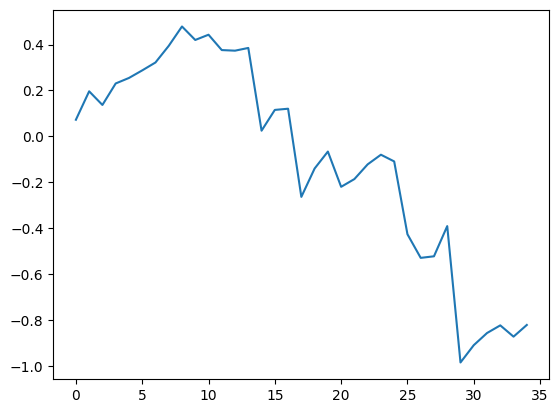

In [703]:
plt.plot(pct_short_array.cumsum())

In [634]:
-0.3 < -0.1

True

In [644]:
len(pct_return_rsi_btc)

119

In [636]:
max(pct_return_rsi_btc)

0.10903192157183818

In [688]:
pct_return_rsi_btc_array = np.array(pct_return_rsi_btc)

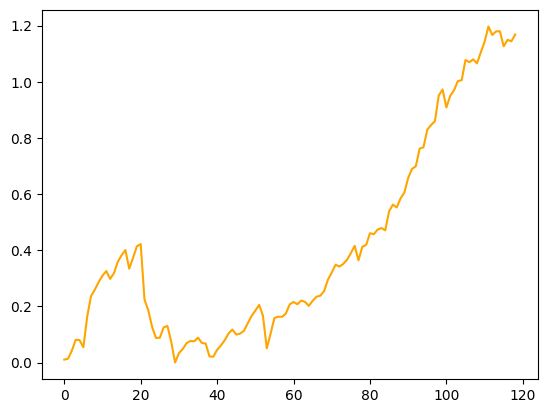

In [689]:
plt.plot(pct_return_rsi_btc_array.cumsum(), 'orange')

In [675]:
pct_return_rsi_btc

[0.01052661662147948,
 0.0033069851856390308,
 0.029170025925309536,
 0.03813454231327954,
 -0.0012957337031541101,
 -0.025040999974818158,
 0.10903192157183818,
 0.07312865352633016,
 0.022697141112724667,
 0.026943987267056477,
 0.02302594280269352,
 0.016422455260117774,
 -0.028046021249331008,
 0.020384903481969717,
 0.040401367925638365,
 0.023423115571655145,
 0.018614496299802948,
 -0.06643744273600577,
 0.038863276679616976,
 0.04095125142230669,
 0.007780105340963751,
 -0.19822057204476878,
 -0.038043707704158984,
 -0.059474423309192205,
 -0.0386723277727473,
 0.0008004637108608222,
 0.036680649527080667,
 0.005569567817090615,
 -0.05699733026955655,
 -0.07328440107419046,
 0.0331478037540354,
 0.014776344942324217,
 0.020863202142187447,
 0.007748478663055903,
 -0.001208014554028705,
 0.013301527985238976,
 -0.019073172789867567,
 -0.0019788147255789226,
 -0.045976673494103025,
 -0.0013345895146530892,
 0.024855553185683405,
 0.015698013444739065,
 0.018605848394809214,
 0.02

In [574]:
len(btc_date_sell)

56

In [483]:
len(btc_date_buy)

1888

In [690]:
pct_return_btc_dt = pd.DataFrame(pct_return_rsi_btc, columns=['Return_rate'])

In [691]:
btc_date_sell_dt = pd.DataFrame(btc_date_sell, columns=['Sell Date'])

In [692]:
money_invest = pd.DataFrame(money_invest, columns=['money_invest'])

In [693]:
result_table = pd.concat([pct_return_btc_dt, btc_date_sell_dt, money_invest], axis=1)

In [694]:
result_table['pnl'] = result_table['money_invest'] * result_table['Return_rate']

In [695]:
result_table['pnl'].sum()

-2516.859924439367

In [696]:
money_invest.max()

money_invest    10000
dtype: int64

In [697]:
364.32 / 8600

0.042362790697674416

In [686]:
result_table.head(30)

,Return_rate,Sell Date,money_invest,pnl
0,0.010527,2022-01-04 13:00:00,10000,105.266166
1,0.003307,2022-01-11 17:00:00,3400,11.243750
2,0.029170,2022-01-20 14:00:00,1200,35.004031
3,0.038135,2022-01-26 13:00:00,4900,186.859257
4,-0.001296,2022-02-15 02:00:00,10000,-12.957337
5,-0.025041,2022-02-23 08:00:00,4600,-115.188600
6,0.109032,2022-02-25 13:00:00,1400,152.644690
7,0.073129,2022-02-28 16:00:00,10000,731.286535
8,0.022697,2022-03-09 03:00:00,3600,81.709708
9,0.026944,2022-03-15 19:00:00,900,24.249589


In [582]:
result_table['pnl'].sum() / 10000

0.04095158471912092

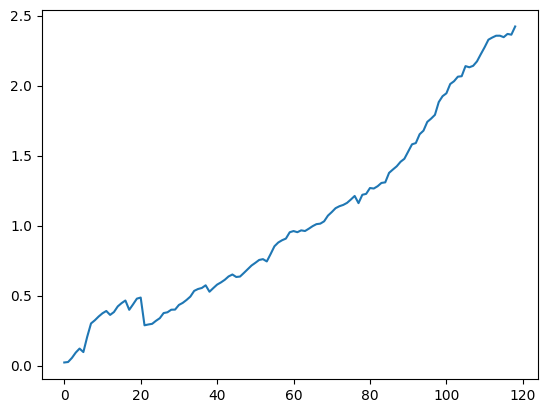

In [523]:
plt.plot(pct_return_rsi_btc_array.cumsum())

In [308]:
dir_root = '/run/user/1001/gvfs/smb-share:server=10.139.25.246,share=quantdata/Lucas'
file_name = 'BNB.csv'
df = pd.read_csv(os.path.join(dir_root, file_name))
df_bnb = df[['date', 'symbol', 'open', 'high', 'low', 'close', 'volume']]

In [319]:
df_bnb_2022 = df_bnb[36284:]

In [320]:
df_bnb_timeindex = df_bnb_2022.copy()
df_bnb_timeindex = df_bnb_timeindex.set_index(df_bnb_timeindex['date'])
df_bnb_timeindex.index = pd.to_datetime(df_bnb_timeindex.index)
df_bnb_vwap = df_bnb_timeindex.join(df_bnb_timeindex.ta.vwap(anchor='h'))
df_bnb_vwap.fillna(method='ffill', inplace=True)

In [321]:
df_bnb_rsi = df_bnb_vwap.join(ta.rsi(df_bnb_vwap['VWAP_H']))
df_bnb_rsi = df_bnb_rsi.dropna()
rsi_ind_bnb = df_bnb_rsi['RSI_14'].tolist()
bnb_close = df_bnb_rsi['close'].tolist()

In [322]:
total_bnb = 0
count = 0
pct_return_rsi_bnb = []
init_money = 10000
trading_cost = 2.5 / 10000
for i in range(len(rsi_ind_bnb)):
    if rsi_ind_bnb[i] < 30:
        bnb_amount = init_money / (bnb_close[i] * (1 + trading_cost))
        total_bnb = total_bnb + bnb_amount
        count = count + 1
    elif rsi_ind_bnb[i] >= 70 and total_bnb > 0:
        pct_return = (total_bnb * (bnb_close[i]*(1 - trading_cost)) - init_money*count) / (init_money * count)
        pct_return_rsi_bnb.append(pct_return)
        total_bnb = 0
        count = 0

In [323]:
pct_return_rsi_bnb

[-0.035219265069293904,
 -0.05607803044778875,
 0.021862831453894616,
 0.030543615563532998,
 -0.00954789063790827,
 0.12323256850753386,
 0.07203319652014707,
 0.057198828346697914,
 0.022884265965387167,
 0.0423655189840405,
 0.055126633939778916,
 0.0362759585391143,
 0.04005717255529857,
 0.023981430171698997,
 0.0417985774947583,
 0.02587798373367074,
 -0.05629809458409145,
 0.06537860900377364,
 0.035044972766913866,
 0.021208278096131107,
 -0.10423629675055031,
 0.037048300611453866,
 0.01074096633372793,
 0.06548578142031547,
 0.028086361920542063,
 0.044446266978173374,
 0.06345293625912472,
 0.009981269656043151,
 0.024076817741124457,
 0.025691989603725502,
 0.03091886757640532,
 0.047558100072162414,
 0.01277284695663028,
 0.04324850608952292,
 0.04138462160964027,
 0.003453036337220974,
 0.022103492555675983,
 0.13000688973053476,
 -0.003826634319769052,
 0.012109445726949013,
 0.021584975528957877,
 -0.04073448158384732,
 0.03624518443584966,
 0.043889897840303095,
 0.051

In [324]:
pct_return_rsi_bnb_array = np.array(pct_return_rsi_bnb)

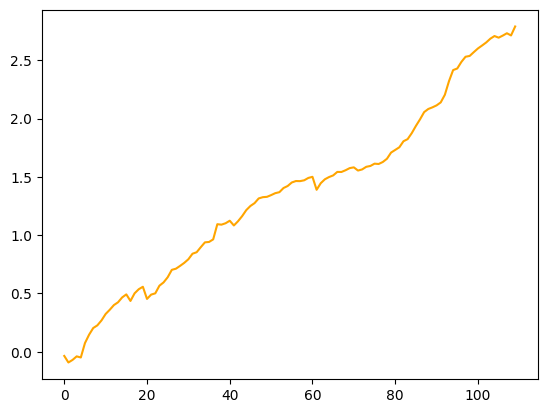

In [325]:
plt.plot(pct_return_rsi_bnb_array.cumsum(), 'orange')

In [326]:
dir_root = '/run/user/1001/gvfs/smb-share:server=10.139.25.246,share=quantdata/Lucas'
file_name = 'SOL.csv'
df = pd.read_csv(os.path.join(dir_root, file_name))
df_sol = df[['date', 'symbol', 'open', 'high', 'low', 'close', 'volume']]

In [343]:
df_sol_2022 = df_sol[12167:]

In [344]:
df_sol_timeindex = df_sol_2022.copy()
df_sol_timeindex = df_sol_timeindex.set_index(df_sol_timeindex['date'])
df_sol_timeindex.index = pd.to_datetime(df_sol_timeindex.index)
df_sol_vwap = df_sol_timeindex.join(df_sol_timeindex.ta.vwap(anchor='h'))
df_sol_vwap.fillna(method='ffill', inplace=True)

In [345]:
df_sol_rsi = df_sol_vwap.join(ta.rsi(df_sol_vwap['VWAP_H']))
df_sol_rsi = df_sol_rsi.dropna()
rsi_ind_sol = df_sol_rsi['RSI_14'].tolist()
sol_close = df_sol_rsi['close'].tolist()

In [347]:
total_sol = 0
count = 0
pct_return_rsi_sol = []
init_money = 10000
trading_cost = 2.5 / 10000
for i in range(len(rsi_ind_sol)):
    if rsi_ind_sol[i] < 30:
        sol_amount = init_money / (sol_close[i] * (1 + trading_cost))
        total_sol = total_sol + sol_amount
        count = count + 1
    elif rsi_ind_sol[i] >= 70 and total_sol > 0:
        pct_return = (total_sol * (sol_close[i]*(1 - trading_cost)) - init_money*count) / (init_money * count)
        pct_return_rsi_sol.append(pct_return)
        total_sol = 0
        count = 0

In [348]:
pct_return_rsi_sol

[-0.0472289840145738,
 0.020945022045637807,
 -0.043385713396128546,
 0.08415590130409721,
 0.15675092459206424,
 0.03224083988458551,
 0.014714223959818242,
 0.1891411984032029,
 -0.0031508726246842547,
 0.05251512465668547,
 0.045497367879751074,
 -0.022113509262228104,
 0.03637210168263162,
 0.10306847155362726,
 0.028381678069433067,
 0.0084773540301035,
 -0.1228543048383578,
 0.06047599575630706,
 0.04828584896493885,
 0.06394008099624945,
 0.07107545636923956,
 0.05647790909229324,
 0.2061178054026814,
 0.03564940816655891,
 0.04775340635958479,
 0.04705580133367743,
 0.026779624602911282,
 0.05632027685817037,
 -0.0670182236494391,
 0.04211447138215444,
 0.06624252283901205,
 0.035050330035573805,
 0.07568099708062097,
 0.02315354738798178,
 0.017743974127655746,
 0.03959535514744639,
 0.024352538336790033,
 0.03620684534522813,
 -0.2489702971669331,
 0.08368072679387442,
 0.04645279498765594,
 0.032255923146035315,
 0.07375284223227857,
 0.006028567706440877,
 0.045142932533120

In [349]:
pct_return_rsi_sol_array = np.array(pct_return_rsi_sol)

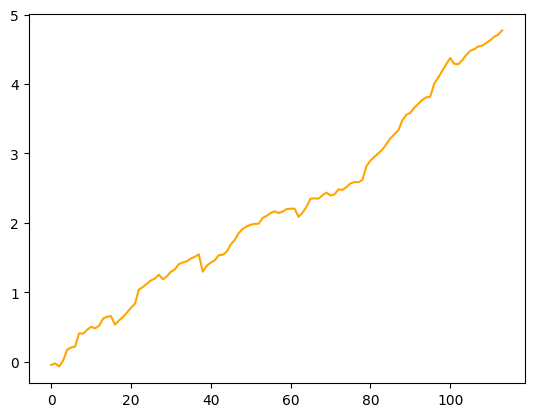

In [350]:
plt.plot(pct_return_rsi_sol_array.cumsum(), 'orange')

In [351]:
dir_root = '/run/user/1001/gvfs/smb-share:server=10.139.25.246,share=quantdata/Lucas'
file_name = 'XRP.csv'
df = pd.read_csv(os.path.join(dir_root, file_name))
df_xrp = df[['date', 'symbol', 'open', 'high', 'low', 'close', 'volume']]

In [359]:
df_xrp_2022 = df_xrp[32017:]

In [360]:
df_xrp_timeindex = df_xrp_2022.copy()
df_xrp_timeindex = df_xrp_timeindex.set_index(df_xrp_timeindex['date'])
df_xrp_timeindex.index = pd.to_datetime(df_xrp_timeindex.index)
df_xrp_vwap = df_xrp_timeindex.join(df_xrp_timeindex.ta.vwap(anchor='h'))
df_xrp_vwap.fillna(method='ffill', inplace=True)

In [361]:
df_xrp_rsi = df_xrp_vwap.join(ta.rsi(df_xrp_vwap['VWAP_H']))
df_xrp_rsi = df_xrp_rsi.dropna()
rsi_ind_xrp = df_xrp_rsi['RSI_14'].tolist()
xrp_close = df_xrp_rsi['close'].tolist()

In [405]:
rsi_ind_xrp

[56.99430668427273,
 60.746131906028445,
 67.3737408183397,
 75.07745834141191,
 77.01164856810028,
 78.82107437600072,
 64.45057200281497,
 60.80021173042507,
 59.62078531408349,
 63.497159494857385,
 55.337673169590325,
 48.81525286624587,
 48.23218353992935,
 50.23270578990277,
 44.13471662339885,
 46.00573053982015,
 47.88539005142773,
 46.76959315926778,
 48.70054229820318,
 57.80571278102992,
 54.824515319975625,
 55.79176207788695,
 55.39872317431285,
 53.66828227815452,
 54.03211960076137,
 72.40797757550386,
 75.92812585916354,
 75.25174247520324,
 57.69735215304984,
 58.17070117452845,
 57.82231246217095,
 58.465247842421554,
 63.28674702417117,
 67.3285566240684,
 57.992275457653406,
 52.24647915685981,
 48.69172423483328,
 44.989537262031305,
 41.24244457252325,
 44.3250128454838,
 43.05995443536658,
 40.25246859285865,
 38.29288745010585,
 33.440976010684885,
 35.654439264218375,
 45.26053072701171,
 42.869349221617476,
 45.01623970070743,
 43.26532351385445,
 40.098087839

In [400]:
total_xrp = 0
count = 0
pct_return_rsi_xrp = []
init_money = 10000
trading_cost = 2.5 / 10000
for i in range(len(rsi_ind_xrp)):
    if rsi_ind_xrp[i] < 30:
        xrp_amount = init_money / (xrp_close[i] * (1 + trading_cost))
        total_xrp = total_xrp + xrp_amount
        count = count + 1
    elif rsi_ind_xrp[i] >= 70 and total_xrp > 0:
        pct_return = (total_xrp * (xrp_close[i]*(1 - trading_cost)) - init_money*count) / (init_money * count)
        pct_return_rsi_xrp.append(pct_return)
        total_xrp = 0
        count = 0

In [401]:
pct_return_rsi_xrp

[0.008380612658214739,
 0.00966621556359205,
 -0.017163243263426702,
 0.03165736658612117,
 0.08110951221344197,
 0.07374660320885554,
 0.10073686787460853,
 0.06314414541418083,
 0.04824939525455011,
 0.08040565972658394,
 0.03899043913234455,
 -0.004092134007188878,
 -0.00715080958545425,
 0.003432434507247052,
 0.07369809445314622,
 -0.10360002574067857,
 0.05128671291143728,
 0.009701318683480944,
 0.018483774634352967,
 0.07198394651531362,
 -0.041482644103149925,
 0.09204317081075787,
 -0.01089342846151062,
 0.02335736597402642,
 0.040078250220595656,
 0.033816566134216554,
 0.03144181126502464,
 0.047547795289091845,
 0.01985557024032303,
 0.05969529187531061,
 0.04290442823928915,
 0.021275209641429385,
 0.13133418728312318,
 0.09495493304888769,
 0.04691283248390071,
 0.05277392147581838,
 0.03216285615243583,
 0.041789250471129705,
 0.05922627230260387,
 -0.03783993024860421,
 0.041437128715251875,
 0.054339504461062824,
 0.012269808363862102,
 0.027663047305954935,
 -0.00831

In [402]:
pct_return_rsi_xrp_array = np.array(pct_return_rsi_xrp)

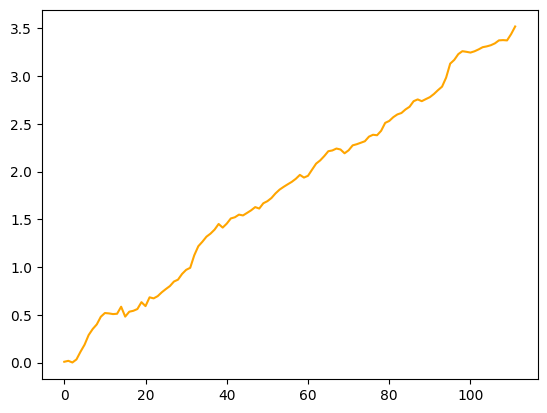

In [403]:
plt.plot(pct_return_rsi_xrp_array.cumsum(), 'orange')

In [408]:
#Annualize XRP
pow(sum(pct_return_rsi_xrp), (1/2.7)) - 1

0.5937559972871276

In [410]:
#Annulize DOGE
pow(sum(pct_return_rsi_doge), (1/2.7)) - 1

0.7069388612935568

In [411]:
#Annulize SOL
pow(sum(pct_return_rsi_sol), (1/2.7)) - 1

0.7840063165379381

In [412]:
#Annualize ETH
pow(sum(pct_return_rsi), (1/2.7)) - 1

0.548692932788938

In [413]:
#Annualize BTC
pow(sum(pct_return_rsi_btc), (1/2.7)) - 1

0.3877388891870175

In [415]:
#Annualize BNB
pow(sum(pct_return_rsi_bnb), (1/2.7)) - 1

0.4620899534297169

In [368]:
dir_root = '/run/user/1001/gvfs/smb-share:server=10.139.25.246,share=quantdata/Lucas'
file_name = 'DOGE.csv'
df = pd.read_csv(os.path.join(dir_root, file_name))
df_doge = df[['date', 'symbol', 'open', 'high', 'low', 'close', 'volume']]

In [385]:
df_doge_2022 = df_doge[21809:]

In [386]:
df_doge_timeindex = df_doge_2022.copy()
df_doge_timeindex = df_doge_timeindex.set_index(df_doge_timeindex['date'])
df_doge_timeindex.index = pd.to_datetime(df_doge_timeindex.index)
df_doge_vwap = df_doge_timeindex.join(df_doge_timeindex.ta.vwap(anchor='h'))
df_doge_vwap.fillna(method='ffill', inplace=True)

In [387]:
df_doge_rsi = df_doge_vwap.join(ta.rsi(df_doge_vwap['VWAP_H']))
df_doge_rsi = df_doge_rsi.dropna()
rsi_ind_doge = df_doge_rsi['RSI_14'].tolist()
doge_close = df_doge_rsi['close'].tolist()

In [393]:
total_doge = 0
count = 0
pct_return_rsi_doge = []
init_money = 100
total_investment = []
trading_cost = 2.5 / 10000
for i in range(len(rsi_ind_doge)):
    if rsi_ind_doge[i] < 30:
        doge_amount = init_money / (doge_close[i] * (1 + trading_cost))
        total_doge = total_doge + doge_amount
        count = count + 1
    elif rsi_ind_doge[i] >= 70 and total_doge > 0:
        pct_return = (total_doge * (doge_close[i]*(1 - trading_cost)) - init_money*count) / (init_money * count)
        total_investment.append(init_money*count)
        pct_return_rsi_doge.append(pct_return)
        total_doge = 0
        count = 0

In [395]:
max(total_investment)

5800

In [389]:
pct_return_rsi_doge

[0.05437590030461858,
 -0.03704235633906223,
 0.042744078816865566,
 0.02514854074158312,
 0.047829857980497964,
 -0.0009557450384798156,
 0.11854411750629924,
 0.007958100465021701,
 0.040213874403952334,
 0.035084421073057,
 0.0784693967636426,
 0.06194463200800848,
 0.04171032897753076,
 0.07302768064112197,
 0.041552835270037176,
 -0.07287490141493623,
 0.021721611210727756,
 0.04711416224450886,
 0.0423037008704141,
 -0.056303151997897,
 0.17010772243244787,
 0.03563469544257452,
 0.0690981071584153,
 -0.0018260635664710013,
 0.04525387736755827,
 0.035935253642650905,
 0.03844926903490631,
 -0.01319056514313658,
 0.031129091908507604,
 0.05611733947518341,
 0.022582096102718576,
 0.04277259090117898,
 0.03856707134275371,
 0.10306854836292177,
 0.015073487280251758,
 0.03455188239487768,
 -0.04927101740589834,
 0.04761209285544197,
 0.05190692456799449,
 0.10010737072939663,
 0.029021580824574553,
 -0.038455321781312043,
 -0.004878545331724534,
 0.03352841076941246,
 0.0435790442

In [391]:
pct_return_rsi_doge_array = np.array(pct_return_rsi_doge)

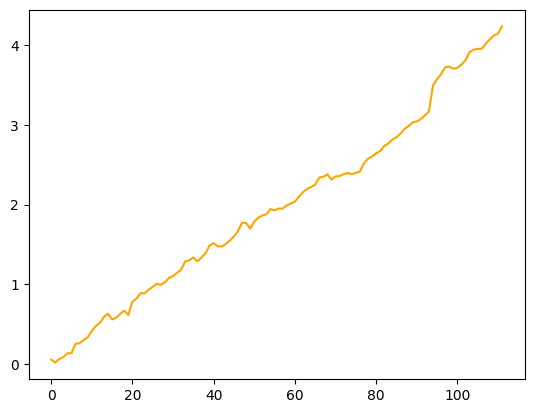

In [392]:
plt.plot(pct_return_rsi_doge_array.cumsum(), 'orange')

In [431]:
df_btc_copy = df_btc.copy()

In [432]:
rsi_copy = df_btc_copy.ta.rsi()

In [433]:
df_con = pd.concat([df_btc_copy, rsi_copy], axis=1)

In [434]:
df_con

,date,symbol,open,high,low,close,volume,RSI_14
0,2017-08-17 04:00:00,BTC,4261.48,4313.62,4261.32,4308.83,47.181009,NaN
1,2017-08-17 05:00:00,BTC,4308.83,4328.69,4291.37,4315.32,23.234916,NaN
2,2017-08-17 06:00:00,BTC,4330.29,4345.45,4309.37,4324.35,7.229691,NaN
3,2017-08-17 07:00:00,BTC,4316.62,4349.99,4287.41,4349.99,4.443249,NaN
4,2017-08-17 08:00:00,BTC,4333.32,4377.85,4333.32,4360.69,0.972807,NaN
...,...,...,...,...,...,...,...,...
60662,2024-07-24 02:00:00,BTC,65666.01,65928.01,65476.84,65878.16,672.373340,42.236844
60663,2024-07-24 03:00:00,BTC,65878.16,66111.50,65784.53,66052.71,601.260330,45.352751
60664,2024-07-24 04:00:00,BTC,66052.71,66072.01,65791.42,65860.00,571.421180,42.619313
60665,2024-07-24 05:00:00,BTC,65860.01,65914.49,65610.00,65814.01,673.836710,41.969213


# Mock Trading

In [418]:
from asyncio import run, gather, ensure_future
import pandas_ta as ta
import pandas as pd
import ccxt.async_support as ccxt  

In [420]:
from asyncio import run, gather, ensure_future
import pandas_ta as ta
import pandas as pd
import ccxt.async_support as ccxt  

# -----------------------------------------------------------------------------

#print('CCXT Version:', ccxt.__version__)

# -----------------------------------------------------------------------------

async def run_ohlcv_loop(exchange, symbol, timeframe, limit):
    since = None
    while True:
        try:
            ohlcv = await exchange.fetch_ohlcv(symbol, timeframe, since, limit)
            if len(ohlcv):
                df = pd.DataFrame(ohlcv, columns=['time', 'open', 'high', 'low', 'close', 'volume'])
                rsi = df.ta.rsi()
                df = pd.concat([df,rsi], axis=1)
                last_row = df.iloc[-1]
                previous_row = df.iloc[-2]
                if last_row['RSI_14'] and previous_row['RSI_14']:
                    now = exchange.milliseconds()
                    iso8601 = exchange.iso8601(now)
                    print(iso8601, timeframe, symbol, '\tRSI_14 =', last_row['RSI_14'])
                    rsienterob = previous_row['RSI_14'] < 70 and last_row['RSI_14'] > 70
                    if rsienterob:
                        message =  iso8601 + ' ' + timeframe + ' ' + symbol + ' is entering overbought zone'
                        print(message)
                        ensure_future(send_discord_webhook_messsage(exchange, symbol, message))
        except Exception as e:
            print(type(e).__name__, str(e))


async def main():
    exchange = ccxt.binance()
    timeframe = '1h'
    limit = 50
    symbols = ['BTC/USDT']
    loops = [run_ohlcv_loop(exchange, symbol, timeframe, limit) for symbol in symbols]
    await gather(*loops)
    await exchange.close()


In [425]:
exchange = ccxt.binance()
timeframe = '1h'
limit = 50
symbols = ['BTC/USDT']
loops = [run_ohlcv_loop(exchange, symbol, timeframe, limit) for symbol in symbols]
await gather(*loops)
await exchange.close()

CancelledError: 

In [426]:
async def fetch_ohlcv(exchange, symbol, timeframe, limit):
    since = None
    while True:
        try:
            ohlcv = await exchange.fetch_ohlcv(symbol, timeframe, since, limit)
            if len(ohlcv):
                first_candle = ohlcv[0]
                datetime = exchange.iso8601(first_candle[0])
                print(datetime, exchange.id, symbol, first_candle[1:])
        except Exception as e:
            print(type(e).__name__, str(e))

In [428]:
exchange = ccxt.binance()
timeframe = '1h'
limit = 10
symbols = [ 'BTC/USDT']
loops = [fetch_ohlcv(exchange, symbol, timeframe, limit) for symbol in symbols]
await gather(*loops)
await exchange.close()


CancelledError: 

In [435]:
exchange = ccxt.binance()
symbol = 'BTC/USDT'
timeframe = '1m'
limit = 500
rsi_length = 100
while True:
    try:
        ohlcv = exchange.fetch_ohlcv(symbol, timeframe)
        print('--------------------------------------------------------------')
        if len(ohlcv):
            df = pd.DataFrame(ohlcv, columns=['time', 'open', 'high', 'low', 'close', 'volume'])
            df['time'] = pd.to_datetime(df['time'], unit='ms')
            df = pd.concat([df, df.ta.rsi(length=rsi_length)], axis=1)
            print(df[-20:])
            print(exchange.iso8601 (exchange.milliseconds()))
    except Exception as e:
        print(type(e).__name__, str(e))

KeyboardInterrupt: 

In [259]:
frama_se_vwap = cal_FRAMA(df_eth_vwap['VWAP_H'], 120)
df_eth_frama_vwap = df_eth_vwap.join(frama_se_vwap)

In [260]:
df_eth_frama_vwap = df_eth_frama_vwap.dropna()

In [248]:
df_eth_frama_vwap

,date,symbol,open,high,low,close,volume,VWAP_H,FRAMA_96
date,,,,,,,,,
2022-01-04 22:00:00,2022-01-04 22:00:00,ETH,3825.99,3826.00,3805.91,3816.62,5805.0681,3816.176667,3816.176667
2022-01-04 23:00:00,2022-01-04 23:00:00,ETH,3816.62,3816.63,3783.89,3785.11,7933.4851,3795.210000,3815.554473
2022-01-05 00:00:00,2022-01-05 00:00:00,ETH,3785.10,3812.24,3766.00,3810.13,8717.3019,3796.123333,3814.977846
2022-01-05 01:00:00,2022-01-05 01:00:00,ETH,3810.13,3810.94,3792.10,3793.33,6428.4201,3798.790000,3814.497466
2022-01-05 02:00:00,2022-01-05 02:00:00,ETH,3793.33,3808.30,3792.80,3802.38,6540.4906,3801.160000,3814.101671
...,...,...,...,...,...,...,...,...,...
2024-07-24 02:00:00,2024-07-24 02:00:00,ETH,3443.61,3451.52,3427.40,3449.81,11334.1082,3442.910000,3463.676923
2024-07-24 03:00:00,2024-07-24 03:00:00,ETH,3449.81,3459.96,3440.42,3448.36,8846.3884,3449.580000,3462.912676
2024-07-24 04:00:00,2024-07-24 04:00:00,ETH,3448.36,3449.58,3432.40,3440.01,7679.6066,3440.663333,3461.706456


In [261]:
df_eth_frama_vwap['diff_frama'] = df_eth_frama_vwap['VWAP_H'] - df_eth_frama_vwap['FRAMA_120']

In [238]:
df_eth_frama_vwap.tail(20)

,date,symbol,open,high,low,close,volume,VWAP_H,FRAMA_48,diff_frama,signal_frama_vwap
date,,,,,,,,,,,
2024-07-23 11:00:00,2024-07-23 11:00:00,ETH,3506.01,3521.38,3481.01,3516.00,19726.5134,3506.130000,3479.220983,26.909017,0
2024-07-23 12:00:00,2024-07-23 12:00:00,ETH,3516.01,3518.80,3486.48,3506.27,13141.7933,3503.850000,3480.062949,23.787051,0
2024-07-23 13:00:00,2024-07-23 13:00:00,ETH,3506.28,3513.96,3429.59,3440.26,51233.3124,3461.270000,3479.420494,-18.150494,-1
2024-07-23 14:00:00,2024-07-23 14:00:00,ETH,3440.27,3496.67,3437.80,3488.62,28669.4858,3474.363333,3479.247610,-4.884277,0
2024-07-23 15:00:00,2024-07-23 15:00:00,ETH,3488.62,3488.72,3437.00,3454.38,32063.1713,3460.033333,3478.605481,-18.572148,0
2024-07-23 16:00:00,2024-07-23 16:00:00,ETH,3454.38,3469.44,3402.55,3403.49,36921.1350,3425.160000,3476.246201,-51.086201,0
2024-07-23 17:00:00,2024-07-23 17:00:00,ETH,3403.49,3429.99,3389.00,3427.97,24809.7174,3415.653333,3473.026999,-57.373666,0
2024-07-23 18:00:00,2024-07-23 18:00:00,ETH,3427.96,3452.77,3418.89,3446.26,13944.5442,3439.306667,3471.235492,-31.928825,0
2024-07-23 19:00:00,2024-07-23 19:00:00,ETH,3446.26,3496.49,3445.27,3457.03,33369.9042,3466.263333,3470.971329,-4.707996,0


In [262]:
diff_frama = df_eth_frama_vwap['diff_frama'].tolist()

In [263]:
signal_frama_vwap = []
for i in range(len(diff_frama)):
    if i == 0:
        signal_frama_vwap.append(0)
    elif diff_frama[i] > 0 and diff_frama[i-1] < 0:
        signal_frama_vwap.append(1)
    elif diff_frama[i] < 0 and diff_frama[i-1] > 0:
        signal_frama_vwap.append(-1)
    else:
        signal_frama_vwap.append(0)

In [264]:
df_eth_frama_vwap['signal_frama_vwap'] = signal_frama_vwap

In [265]:
decision_price_frama_vwap = []
for index, row in df_eth_frama_vwap.iterrows():
    if row['signal_frama_vwap'] == 1:
        decision_price_frama_vwap.append(-1 * row['close'])
    elif row['signal_frama_vwap'] == -1:
        decision_price_frama_vwap.append(row['close'])

In [266]:
decision_price_frama_vwap

[3508.31,
 -3394.8,
 3397.01,
 -3401.24,
 3406.81,
 -3214.88,
 3181.77,
 -3235.79,
 3203.5,
 -3218.69,
 3219.95,
 -3118.45,
 3080.95,
 -3119.43,
 3107.58,
 -3128.42,
 3085.01,
 -3159.96,
 3151.97,
 -3175.18,
 3145.27,
 -3082.68,
 3115.34,
 -3133.56,
 3301.43,
 -3272.32,
 3268.97,
 -3276.55,
 3304.55,
 -3308.22,
 3282.8,
 -3338.7,
 3303.67,
 -3334.38,
 3311.52,
 -3332.14,
 3340.46,
 -3350.8,
 3319.99,
 -3158.23,
 3122.68,
 -3150.68,
 3128.17,
 -3122.72,
 3195.38,
 -2467.04,
 2418.65,
 -2446.04,
 2379.37,
 -2448.0,
 2395.36,
 -2432.51,
 2433.51,
 -2445.5,
 2436.62,
 -2348.01,
 2379.22,
 -2385.41,
 2419.34,
 -2432.91,
 2438.26,
 -2458.83,
 2423.66,
 -2444.86,
 2451.31,
 -2487.63,
 2519.12,
 -2487.16,
 2448.7,
 -2431.65,
 2396.22,
 -2446.92,
 2390.3,
 -2430.45,
 2395.83,
 -2442.94,
 2525.04,
 -2552.07,
 2751.02,
 -2770.08,
 2756.54,
 -2781.05,
 2759.95,
 -2775.35,
 2766.89,
 -2800.99,
 2687.05,
 -2672.66,
 2618.99,
 -2640.01,
 2613.6,
 -2659.97,
 3017.05,
 -3020.0,
 3003.08,
 -3018.98,
 30

In [267]:
pct_return_list = []
init_money = 10000
trading_cost = 2.5 / 10000
total_eth = 0
count = 0
for i in range(len(decision_price_frama_vwap)):
    if decision_price_frama_vwap[i] > 0:
        eth_amount = init_money / (decision_price_frama_vwap[i] * (1 + trading_cost))
        total_eth = total_eth + eth_amount
        count = count + 1
    elif decision_price_frama_vwap[i] < 0 and total_eth > 0:
        pct_return = (total_eth * (-1 * decision_price_frama_vwap[i]) * (1-trading_cost) - init_money*count) / init_money*count
        count = 0
        total_eth = 0
        pct_return_list.append(-1 * pct_return)

In [268]:
pct_return_list

[0.03283831125415381,
 -0.0007447152197777541,
 0.05680887347414155,
 -0.016469609485492764,
 -0.004239443494830812,
 0.032006346462267174,
 -0.011983535867603132,
 -0.006202955661563465,
 -0.023782877493517297,
 -0.006860092830293434,
 0.020389650097228512,
 -0.0053456802779473945,
 0.009312858689184578,
 -0.0018177390634920812,
 -0.0006101597567425416,
 -0.016519759727425115,
 -0.008791200904850121,
 -0.0057237602108385546,
 -0.002593959737674777,
 0.04919855792334311,
 -0.008462299606929083,
 0.0022412368117977165,
 0.22832126748526815,
 -0.01081896333846562,
 -0.02832947625779907,
 -0.015001523356720099,
 -0.004424701608416217,
 0.03684764615414242,
 -0.002100517439213036,
 -0.005106288920838051,
 -0.007932251801255915,
 -0.008242854002259992,
 -0.014309286004638853,
 0.013180503184725058,
 0.007459272724188304,
 -0.020647872811575325,
 -0.016288783303483614,
 -0.01915362746571209,
 -0.010199554830425585,
 -0.0064250009718054574,
 -0.008387261764518008,
 -0.005077146988909771,
 -0.

In [269]:
pct_array = np.array(pct_return_list)

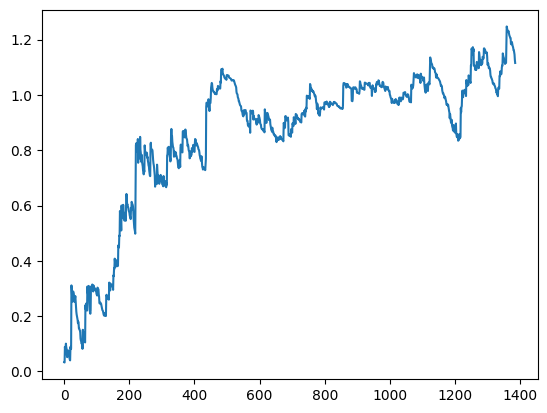

In [270]:
plt.plot(pct_array.cumsum())

In [163]:
frama_se_long = cal_FRAMA(df_eth_vwap['close'], 96)
frama_se_short = cal_FRAMA(df_eth_vwap['close'], 24)

In [164]:
df_eth_frama = df_eth_vwap.join(frama_se_long)
df_eth_frama = df_eth_frama.join(frama_se_short)

In [165]:
df_eth_frama = df_eth_frama.dropna()

In [170]:
df_eth_frama['frama_diff'] = df_eth_frama['FRAMA_24'] - df_eth_frama['FRAMA_96']

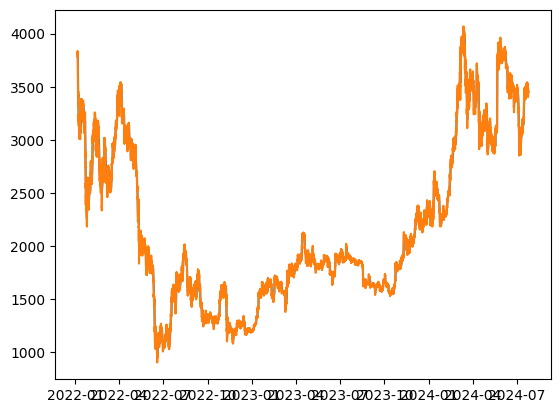

In [169]:
plt.plot(df_eth_frama['FRAMA_96'])
plt.plot(df_eth_frama['close'])

In [185]:
df_eth_frama

,date,symbol,open,high,low,close,volume,VWAP_H,FRAMA_96,FRAMA_24,frama_diff,signal_bs,EMA_48
date,,,,,,,,,,,,,
2022-01-04 22:00:00,2022-01-04 22:00:00,ETH,3825.99,3826.00,3805.91,3816.62,5805.0681,3816.176667,3816.620000,3813.865066,-2.754934,0,NaN
2022-01-04 23:00:00,2022-01-04 23:00:00,ETH,3816.62,3816.63,3783.89,3785.11,7933.4851,3795.210000,3815.877105,3811.204431,-4.672673,0,NaN
2022-01-05 00:00:00,2022-01-05 00:00:00,ETH,3785.10,3812.24,3766.00,3810.13,8717.3019,3796.123333,3815.741608,3811.105017,-4.636591,0,NaN
2022-01-05 01:00:00,2022-01-05 01:00:00,ETH,3810.13,3810.94,3792.10,3793.33,6428.4201,3798.790000,3815.213221,3810.411992,-4.801229,0,NaN
2022-01-05 02:00:00,2022-01-05 02:00:00,ETH,3793.33,3808.30,3792.80,3802.38,6540.4906,3801.160000,3814.910658,3809.980896,-4.929762,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-07-24 02:00:00,2024-07-24 02:00:00,ETH,3443.61,3451.52,3427.40,3449.81,11334.1082,3442.910000,3462.731281,3462.791229,0.059948,0,3473.048885
2024-07-24 03:00:00,2024-07-24 03:00:00,ETH,3449.81,3459.96,3440.42,3448.36,8846.3884,3449.580000,3461.308222,3460.883891,-0.424331,-1,3472.041176
2024-07-24 04:00:00,2024-07-24 04:00:00,ETH,3448.36,3449.58,3432.40,3440.01,7679.6066,3440.663333,3459.199249,3459.191920,-0.007329,0,3470.733781


In [184]:
df_eth_frama = df_eth_frama.join(df_eth_frama.ta.ema(length=48))

In [186]:
df_eth_frama['ema_vwap_diff'] = df_eth_frama['VWAP_H'] - df_eth_frama['EMA_48']

In [187]:
ema_vwap_diff = df_eth_frama['ema_vwap_diff'].tolist()

In [188]:
signal_ema = []
for i in range(len(ema_vwap_diff)):
    if i == 0:
        signal_ema.append(0)
    elif ema_vwap_diff[i] > 0 and ema_vwap_diff[i-1] < 0:
        signal_ema.append(1)
    elif ema_vwap_diff[i] < 0 and ema_vwap_diff[i-1] > 0:
        signal_ema.append(-1)
    else:
        signal_ema.append(0)

In [189]:
df_eth_frama['signal_ema'] = signal_ema

In [191]:
decision_price_ema = []
for index, row in df_eth_frama.iterrows():
    if row['signal_ema'] == 1:
        decision_price_ema.append(row['close'])
    elif row['signal_ema'] == -1:
        decision_price_ema.append(-1 * row['close'])

In [192]:
decision_price_ema

[3168.63,
 -3151.97,
 3175.18,
 -3161.45,
 3120.2,
 -3110.66,
 3129.59,
 -3093.7,
 3121.93,
 -3115.34,
 3133.56,
 -3281.71,
 3304.81,
 -3268.97,
 3278.0,
 -3282.8,
 3302.74,
 -3303.67,
 3317.3,
 -3306.0,
 3334.38,
 -3312.01,
 3332.14,
 -3319.99,
 3138.91,
 -3130.43,
 3139.47,
 -3136.01,
 3181.79,
 -3081.34,
 2465.16,
 -2388.02,
 2426.02,
 -2419.34,
 2432.91,
 -2412.84,
 2437.58,
 -2417.95,
 2487.16,
 -2448.7,
 2440.83,
 -2421.64,
 2474.0,
 -2575.42,
 2601.68,
 -2538.98,
 2587.07,
 -2687.05,
 2695.46,
 -3066.36,
 3117.0,
 -3075.59,
 3099.93,
 -3170.0,
 3209.91,
 -3121.07,
 2937.16,
 -2879.64,
 2941.21,
 -3062.12,
 3070.7,
 -3065.0,
 3109.28,
 -3065.11,
 2722.32,
 -2680.21,
 2723.4,
 -2638.77,
 2623.82,
 -2602.49,
 2636.29,
 -2622.51,
 2650.8,
 -2649.4,
 2596.31,
 -2682.35,
 2736.62,
 -2738.35,
 2757.65,
 -2895.01,
 2929.93,
 -2887.73,
 2620.19,
 -2570.19,
 2585.41,
 -2559.46,
 2592.61,
 -2553.33,
 2575.97,
 -2661.27,
 2652.63,
 -2581.11,
 2595.15,
 -2582.68,
 2591.68,
 -2584.41,
 2570.2

In [193]:
pct_return_list = []
init_money = 10000
trading_cost = 2.5 / 10000
total_eth = 0
count = 0
for i in range(len(decision_price_ema)):
    if decision_price_ema[i] > 0:
        eth_amount = init_money / (decision_price_ema[i] * (1 + trading_cost))
        total_eth = total_eth + eth_amount
        count = count + 1
    elif decision_price_ema[i] < 0 and total_eth > 0:
        pct_return = (total_eth * (-1 * decision_price_ema[i]) * (1-trading_cost) - init_money*count) / init_money*count
        count = 0
        total_eth = 0
        pct_return_list.append(pct_return)

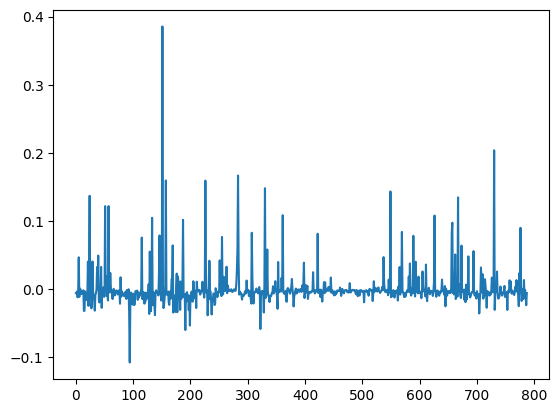

In [194]:
plt.plot(pct_return_list)

In [195]:
pct_array = np.array(pct_return_list)

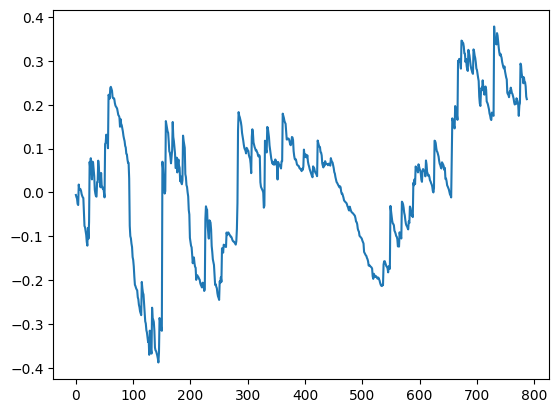

In [196]:
plt.plot(pct_array.cumsum())

In [171]:
diff = df_eth_frama['frama_diff'].tolist()

In [172]:
diff

[-2.75493376620625,
 -4.672673301395662,
 -4.636591176839829,
 -4.801229245295417,
 -4.9297623715665395,
 -4.829513597473579,
 -4.708289348909602,
 -4.9835237292359125,
 -3.8711229610444207,
 -3.291774417459237,
 -2.2965765661924706,
 -1.1503474082492176,
 -0.5584663717413605,
 -2.1736085226721116,
 -3.5740379688513713,
 -3.264293443025508,
 -3.0364395776518904,
 -2.8223786181233663,
 -2.589476260171523,
 -1.8107603120483873,
 -4.605584805781291,
 -25.021365396636156,
 -47.095556172020224,
 -62.939570403243124,
 -72.83396781354168,
 -77.82117805940698,
 -79.97779854221426,
 -80.28230328285144,
 -78.59665558189818,
 -72.97677727140353,
 -66.86326416343218,
 -60.36693933813149,
 -54.14627644324855,
 -47.6460587830029,
 -41.09741441593451,
 -32.87793153274788,
 -26.302345226198668,
 -21.041876180958752,
 -16.83350094476691,
 -13.692157640906771,
 -10.953726112725235,
 -8.762980890180188,
 -7.0103847121440594,
 -5.6083077697153385,
 -4.486646215772453,
 -3.5893169726177803,
 -2.87145357809

In [174]:
signal_frama = []
for i in range(len(diff)):
    if i == 0:
        signal_frama.append(0)
    elif diff[i] > 0 and diff[i-1] < 0:
        signal_frama.append(1)
    elif diff[i] < 0 and diff[i-1] > 0:
        signal_frama.append(-1)
    else:
        signal_frama.append(0)

In [175]:
df_eth_frama['signal_bs'] = signal_frama 

In [176]:
decision_price_frama = []
for index, row in df_eth_frama.iterrows():
    if row['signal_bs'] == 1:
        decision_price_frama.append(row['close'])
    elif row['signal_bs'] == -1:
        decision_price_frama.append(-1 * row['close'])

In [177]:
decision_price_frama

[3366.71,
 -3215.67,
 3176.31,
 -3138.14,
 3085.01,
 -3159.96,
 3146.0,
 -3386.43,
 3301.43,
 -3307.42,
 3302.76,
 -3258.22,
 3099.38,
 -3144.2,
 3261.42,
 -3061.02,
 2384.01,
 -2539.01,
 2386.65,
 -2442.0,
 2427.86,
 -2432.91,
 2476.26,
 -2620.66,
 2715.08,
 -2773.99,
 2687.05,
 -2618.99,
 2796.79,
 -3054.99,
 3103.83,
 -3136.3,
 3199.76,
 -3214.39,
 3111.59,
 -3038.7,
 2889.6,
 -2883.06,
 2858.61,
 -2927.56,
 3021.0,
 -3148.58,
 3083.85,
 -2950.21,
 2728.48,
 -2763.63,
 2731.45,
 -2667.82,
 2606.86,
 -2723.4,
 2651.76,
 -2496.21,
 2616.76,
 -2820.97,
 2608.23,
 -2625.34,
 2808.26,
 -2828.0,
 2646.77,
 -2620.19,
 2468.02,
 -2549.27,
 2698.56,
 -2594.05,
 2564.38,
 -2539.15,
 2599.46,
 -2572.74,
 2584.67,
 -2587.29,
 2568.8,
 -2515.65,
 2519.16,
 -2586.58,
 2526.74,
 -2570.77,
 2532.27,
 -2624.91,
 2621.74,
 -2844.49,
 2939.48,
 -2826.57,
 2876.8,
 -2861.38,
 2914.12,
 -3031.59,
 3048.58,
 -3012.63,
 3078.86,
 -3143.35,
 3127.06,
 -3146.95,
 3238.35,
 -3388.59,
 3386.28,
 -3437.09,
 33

In [178]:
pct_return_list = []
init_money = 10000
trading_cost = 2.5 / 10000
total_eth = 0
count = 0
for i in range(len(decision_price_frama)):
    if decision_price_frama[i] > 0:
        eth_amount = init_money / (decision_price_frama[i] * (1 + trading_cost))
        total_eth = total_eth + eth_amount
        count = count + 1
    elif decision_price_frama[i] < 0 and total_eth > 0:
        pct_return = (total_eth * (-1 * decision_price_frama[i]) * (1-trading_cost) - init_money*count) / init_money*count
        count = 0
        total_eth = 0
        pct_return_list.append(pct_return)

In [179]:
pct_return_list

[-0.04534023813803815,
 -0.012510957000589587,
 0.023782877493517297,
 0.07588595301905607,
 0.0013135833030441062,
 -0.013978824626764981,
 0.013953853005042219,
 -0.0619147878740343,
 0.06448413064413544,
 0.022680034849561707,
 0.0015791063066815695,
 0.057784722727267944,
 0.02118661389796398,
 -0.025816106030060293,
 0.09177410058613823,
 0.009956164461170557,
 0.004070057347527472,
 -0.023913488042266545,
 -0.00276203270610913,
 0.02360818224715367,
 0.04171006404307555,
 -0.04381365381452451,
 0.012376315885550866,
 -0.023783549618645157,
 0.04418290216579135,
 -0.05912970745909788,
 0.07750036974469039,
 0.006056850080506047,
 0.0065258748875270615,
 -0.010537284145623016,
 0.03240479557665876,
 -0.0392085782138598,
 -0.010333592402677822,
 -0.010773794745015584,
 0.0005132873173044572,
 -0.021180127149776126,
 0.026249636085714883,
 0.01691702995398573,
 0.03606561426377975,
 0.08442031264442013,
 -0.038892229838971074,
 -0.00585731799808691,
 0.03979060019972967,
 -0.01228635

In [180]:
pct_array = np.array(pct_return_list)

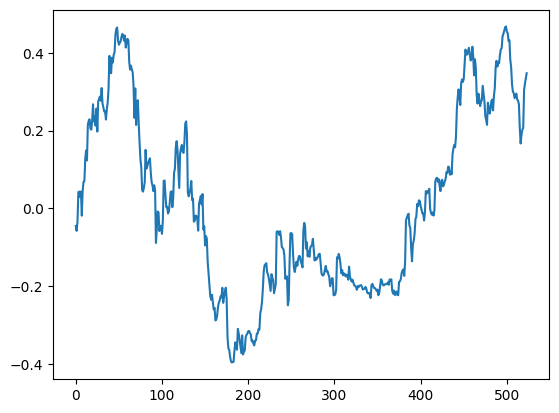

In [181]:
plt.plot(pct_array.cumsum())

In [ ]:
import math
import pandas_ta as ta
from sklearn.linear_model import LinearRegression
 
def cal_MA(prices: pd.Series, periods: int) -> pd.Series:
    return prices.rolling(periods).mean()
 
def cal_XMA(prices: pd.DataFrame, periods: int) -> pd.Series:
    return prices.ta.sma(length=periods).values
 
def cal_EMA(prices: pd.DataFrame, periods: int) -> pd.Series:
    return prices.ta.ema(length=periods).values
 
def cal_LLT(prices: pd.Series, periods: int) -> pd.Series:
    def cal_LLT_a(prices: pd.Series, alpha: float) -> pd.Series:
        llt = pd.Series(index=prices.index, dtype='float64')
        # 需要至少两个价格点来计算LLT
        if len(prices) < 2:
            return prices
        # 初始化LLT的前两个值
        llt[0] = prices[0]
        llt[1] = prices[1]
        # 使用给定的公式计算接下来的LLT值
        for t in range(2, len(prices)):
            llt[t] = ((alpha - alpha**2 / 4) * prices[t] +
                      (alpha**2 / 2) * prices[t-1] -
                      (alpha - 3 * alpha**2 / 4) * prices[t-2] +
                      2 * (1 - alpha) * llt[t-1] -
                      (1 - alpha)**2 * llt[t-2])
        return llt
 
    alpha = 2. / (periods + 1.)
    llt = cal_LLT_a(prices, alpha)
    return llt
# 计算FRAMA均线
 
def cal_FRAMA(prices: pd.Series, periods: int, clip=True) -> pd.Series:
 
    T = int(periods/2)
    df = prices.copy().reset_index().drop(columns=prices.index.name)
    df = df[df.columns[0]]
    # 1.用窗口 W1 内的最高价和最低价计算 N1 = (最高价 – 最低价) / T
    N1 = (df.rolling(T).max()-df.rolling(T).min())/T
 
    # 2.用窗口 W2 内的最高价和最低价计算 N2 = (最高价 – 最低价) / T
    n2_df = df.shift(T)
    N2 = (n2_df.rolling(T).max()-n2_df.rolling(T).min())/T
 
    # 3.用窗口 T 内的最高价和最低价计算 N3 = (最高价 – 最低价) / (2T)
    N3 = (df.rolling(periods).max() -
          df.rolling(periods).min())/periods
 
    # 4.计算分形维数 D = [log(N1+N2) – log(N3)] / log(2)
    D = (np.log10(N1+N2)-np.log10(N3))/np.log10(2)
 
    # 5.计算指数移动平均的参数 alpha = exp(-4.6(D-1))
    alpha = np.exp(-4.6*(D-1))
 
    # 设置上线
    if clip:
        alpha = np.clip(alpha, 0.01, 0.2)
    #display(alpha)
    FRAMA = []
    #idx = min(np.argwhere(~np.isnan(alpha)))-1
    idx = min(alpha[alpha.notnull()].index.to_numpy())-1
    for row, data in enumerate(alpha):
        if row == (idx):
            FRAMA.append(df.iloc[row])
        elif row > (idx):
            FRAMA.append(data*df.iloc[row] +
                         (1-data)*FRAMA[-1])
        else:
            FRAMA.append(np.nan)
 
    FRAMA_se = pd.Series(FRAMA, index=prices.index)
 
    return FRAMA_se
 
def cal_HMA(se, periods):
 
    close = se.values
    hma = talib.WMA(2*talib.WMA(close, int(periods/2)) -
                    talib.WMA(close, periods), int(math.sqrt(periods)))
 
    return pd.Series(hma, index=se.index)
 
def cal_RSRS(prices: pd.DataFrame, win_n=16, win_m=300, adjust=None):
    beta = np.full(prices.shape[0], np.nan)
    r_squared = np.full(prices.shape[0], np.nan)
    # 逐个滚动窗口计算
    for i in range(win_n-1, len(prices)):
        # 获取窗口数据
        y = prices['price_high'].iloc[i-win_n+1:i+1].values
        X = np.c_[np.ones(win_n), prices['price_low'].iloc[i-win_n+1:i+1].values]
        # 线性回归模型
        model = LinearRegression()
        model.fit(X, y)
        # 保存斜率和R-squared
        beta[i] = model.coef_[1]
        r_squared[i] = model.score(X, y)
 
    df = pd.DataFrame([beta, r_squared]).T
    df.columns = ['beta', 'r_squared']
    df.index = prices.index.get_level_values(0)
    rolling_mean = df['beta'].rolling(window=win_m).mean()
    rolling_std = df['beta'].rolling(window=win_m).std()
    df['z_score'] = (df['beta'] - rolling_mean) / rolling_std
    df['z_score_r_squared'] = df['z_score'] * df['r_squared']
    df['z_score_positive'] = df['z_score_r_squared'] * df['beta']
 
    col = 'z_score'
    if adjust == 'rsquared':
        col = 'z_score_r_squared'
    if adjust == 'positive':
        col = 'z_score_positive'
    return df[col]
 
def cal_ICU(prices, window):
 
    def repeated_median_regression(x, y):
 
        n = len(x)
        slopes = []
        # 计算所有点对的斜率
        for i in range(n):
            for j in range(i + 1, n):
                if x[j] != x[i]:
                    slopes.append((y[j] - y[i]) / (x[j] - x[i]))
        # 计算所有斜率的中位数
        median_slope = np.median(slopes)    
        # 计算所有截距的中位数
        intercepts = y - median_slope * x
        median_intercept = np.median(intercepts)
        return median_slope, median_intercept
    icu_ma = []
 
    for i in range(len(prices)):
        if i < window - 1:
            icu_ma.append(np.nan)  # 前window-1个点无法计算均线
        else:
            x = np.arange(window)
            y = prices[i - window + 1:i + 1].values
            slope, intercept = repeated_median_regression(x, y)
            icu_ma.append(intercept + slope * (window - 1))  # 计算窗口最后一个点的均线值
 
    return pd.Series(icu_ma, index=prices.index)
 
def cal_US(price, period):
    # 初始化变量
    a1 = np.exp(-1.414 * np.pi / period)
    b1 = 2 * a1 * np.cos(1.414 * 180 / period)
    c2 = b1
    c3 = -a1 * a1
    c1 = (1 + c2 - c3) / 4
    # 准备输出结果的序列
    us = np.zeros(len(price))
    # 计算 Ultimate Smoother
    for i in range(len(price)):
        if i < 4:
            us[i] = price[i]
        else:
            us[i] = (1 - c1) * price[i] + (2 * c1 - c2) * price[i - 1] \
                    - (c1 + c3) * price[i - 2] + c2 * us[i - 1] + c3 * us[i - 2]
    return us